In [1]:
from neo import io
import neo
import numpy as np
from pathlib import Path
import matplotlib.pylab as plt 
import seaborn as sns
import pandas as pd
from scipy import stats
from utils import *
from utils_spectral import *
from utils_BK_corr import *
from utils_analysis import *
import matplotlib.colors as mcolors
from matplotlib.gridspec import GridSpec
from matplotlib.colors import Normalize
import h5py
from mpl_toolkits.mplot3d import Axes3D
from color_manager import *

/home/nix/Uni/3Year/Thesis/testStefania/multiLevels/utils_spectral.py:4: DeprecationWarning: 
The `fooof` package is being deprecated and replaced by the `specparam` (spectral parameterization) package.
This version of `fooof` (1.1) is fully functional, but will not be further updated.
New projects are recommended to update to using `specparam` (see Changelog for details).
  from fooof import FOOOF


In [2]:
sns.set_theme(style="dark")
sns.set_context("notebook")
plt.style.use('ggplot')
plt.rcParams['font.family'] = 'DejaVu Serif'
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['font.size'] = 8
plt.rcParams['axes.titlesize'] = 8
plt.rcParams['axes.labelsize'] = 6
plt.rcParams['figure.labelsize'] = 6
plt.rcParams['legend.fontsize'] = 6
plt.rcParams['figure.titlesize'] = 10
plt.rcParams['xtick.labelsize'] = 6
plt.rcParams['ytick.labelsize'] = 6
plt.rcParams['figure.figsize'] = (8.27, 12)


In [3]:
# loading the data
PATH = "/home/nix/Uni/3Year/Thesis/testStefania/multiLevels"

# the entire recording with the stimulus
corr_results_stimulus = pd.read_csv(Path(PATH) / "correlation_results_stimulus.csv")
foof_features_stimulus = pd.read_csv(Path(PATH) / "foof_features_stimulus.csv")
entire_ica_projections = pd.read_csv(Path(PATH) / "ica_projections_entire_stimulus.csv")

# baseline
corr_results_baseline = pd.read_csv(Path(PATH) / "correlation_results_baseline12.csv")
foof_features_baseline = pd.read_csv(Path(PATH) / "foof_features_baseline12.csv")
psdPC_baseline = pd.read_csv(Path(PATH) / "psdPC_baseline12.csv")
baseline_ica_projections = pd.read_csv(Path(PATH) / "ica_projections_baseline.csv")

# step stimulus
corr_results_step = pd.read_csv(Path(PATH) / "correlation_results_step.csv")
foof_features_step = pd.read_csv(Path(PATH) / "foof_features_step.csv")
psdPC_step = pd.read_csv(Path(PATH) / "psdPC_step.csv")
step_ica_projections = pd.read_csv(Path(PATH) / "ica_projections_step.csv")

# burst stimulus
corr_results_burst = pd.read_csv(Path(PATH) / "correlation_results_burst.csv")
foof_features_burst = pd.read_csv(Path(PATH) / "foof_features_burst.csv")
psdPC_burst = pd.read_csv(Path(PATH) / "psdPC_burst.csv")
burst_ica_projections = pd.read_csv(Path(PATH) / "ica_projections_burst.csv")

# synapse information
synapse_details_df = pd.read_csv(Path(PATH) / "synapse_details.csv")

In [4]:
foof_features_stimulus['cell_id'] = np.arange(1, len(foof_features_stimulus) + 1)
foof_features_baseline['cell_id'] = np.arange(1, len(foof_features_baseline) + 1)
foof_features_step['cell_id'] = np.arange(1, len(foof_features_step) + 1)
foof_features_burst['cell_id'] = np.arange(1, len(foof_features_burst) + 1)

corr_results_baseline['cell_id'] = np.arange(1, len(corr_results_baseline) + 1)
corr_results_step['cell_id'] = np.arange(1, len(corr_results_step) + 1)
corr_results_burst['cell_id'] = np.arange(1, len(corr_results_burst) + 1)

In [5]:
foof_features_baseline.head()

,Peak1_Freq,Peak1_Power,Peak1_Bandwidth,Aperiodic_Offset,Aperiodic_Exponent,Total_Energy_Entire_PSD,Mean_Phase,Std_Phase,Mean_Firing_Rate,Total_Energy,cell_id
0,1785.805071,2.105720,29.001421,1.969041,1.827419,5.137805,6.153034,1.964513,46.443278,33.446594,1
1,2289.017874,2.239553,3000.000000,4.006054,2.686008,4.414709,2.361586,1.840048,44.673220,29.348993,2
2,1484.001709,2.347297,20.815239,1.681459,1.703779,5.170732,0.037555,2.000181,47.492694,31.811520,3
3,3682.193282,3.367403,1052.029096,4.526399,3.002476,4.431036,0.015829,1.955101,46.466525,24.607132,4
4,1670.165070,2.200632,38.820572,2.063714,1.803043,5.367068,0.003894,1.970182,48.077179,28.871596,5


In [6]:
foof_features_baseline['Total_Inh_Synapses'] = synapse_details_df['total_inh_synapses']
foof_features_step['Total_Inh_Synapses'] = synapse_details_df['total_inh_synapses']
foof_features_burst['Total_Inh_Synapses'] = synapse_details_df['total_inh_synapses']

foof_features_baseline['Total_Exc_Synapses'] = synapse_details_df['total_exc_synapses']
foof_features_step['Total_Exc_Synapses'] = synapse_details_df['total_exc_synapses']
foof_features_burst['Total_Exc_Synapses'] = synapse_details_df['total_exc_synapses']

foof_features_baseline['Total_Weighted_Synapses'] = synapse_details_df['total_weighted_synapses']
foof_features_step['Total_Weighted_Synapses'] = synapse_details_df['total_weighted_synapses']
foof_features_burst['Total_Weighted_Synapses'] = synapse_details_df['total_weighted_synapses']

In [7]:
foof_features_stimulus['Mean_Phase'] = np.degrees(foof_features_stimulus['Mean_Phase'])
foof_features_baseline['Mean_Phase'] = np.degrees(foof_features_baseline['Mean_Phase'])
foof_features_step['Mean_Phase'] = np.degrees(foof_features_step['Mean_Phase'])
foof_features_burst['Mean_Phase'] = np.degrees(foof_features_burst['Mean_Phase'])

In [8]:
# 3d positions dataframe
cell_positions = pd.read_csv(Path(PATH) / "cell_positions.csv")
pc_positions = cell_positions[cell_positions['cell_type'] == 'purkinje_cell']
pc_with_features_stimulus = pc_positions.merge(foof_features_stimulus, on='cell_id')
pc_with_features_baseline = pc_positions.merge(foof_features_baseline, on='cell_id')
pc_with_features_step = pc_positions.merge(foof_features_step, on='cell_id')
pc_with_features_burst = pc_positions.merge(foof_features_burst, on='cell_id')


In [9]:
MLI_positions = cell_positions[(cell_positions['cell_type'] == 'stellate_cell') | (cell_positions['cell_type'] == 'basket_cell')]

In [10]:
# adding ICA components weights
pc_with_features_stimulus['ICA_Component_1'] = entire_ica_projections['ICA_Component_1']
pc_with_features_baseline['ICA_Component_1'] = baseline_ica_projections['ICA_Component_1']
pc_with_features_step['ICA_Component_1'] = step_ica_projections['ICA_Component_1']
pc_with_features_burst['ICA_Component_1'] = burst_ica_projections['ICA_Component_1']

pc_with_features_stimulus['ICA_Component_2'] = entire_ica_projections['ICA_Component_2']
pc_with_features_baseline['ICA_Component_2'] = baseline_ica_projections['ICA_Component_2']
pc_with_features_step['ICA_Component_2'] = step_ica_projections['ICA_Component_2']
pc_with_features_burst['ICA_Component_2'] = burst_ica_projections['ICA_Component_2']

In [11]:
# adding correlations
pc_with_features_baseline = pc_with_features_baseline.merge(corr_results_baseline[['cell_id', 'pc_MLI_correlations']], on='cell_id')
pc_with_features_step = pc_with_features_step.merge(corr_results_step[['cell_id', 'pc_MLI_correlations']], on='cell_id')
pc_with_features_burst = pc_with_features_burst.merge(corr_results_burst[['cell_id', 'pc_MLI_correlations']], on='cell_id')

In [12]:
pc_with_features_baseline

,x,y,z,cell_type,cell_id,Peak1_Freq,Peak1_Power,Peak1_Bandwidth,Aperiodic_Offset,Aperiodic_Exponent,...,Mean_Phase,Std_Phase,Mean_Firing_Rate,Total_Energy,Total_Inh_Synapses,Total_Exc_Synapses,Total_Weighted_Synapses,ICA_Component_1,ICA_Component_2,pc_MLI_correlations
0,75.622307,9.909550,137.5,purkinje_cell,1,1785.805071,2.105720,29.001421,1.969041,1.827419,...,352.542869,1.964513,46.443278,33.446594,60,1634,106.42,-0.014925,-0.172251,0.067339
1,33.403757,22.655929,137.5,purkinje_cell,2,2289.017874,2.239553,3000.000000,4.006054,2.686008,...,135.308903,1.840048,44.673220,29.348993,60,1634,106.42,-0.193423,-0.211617,0.048030
2,69.794482,30.924364,137.5,purkinje_cell,3,1484.001709,2.347297,20.815239,1.681459,1.703779,...,2.151715,2.000181,47.492694,31.811520,60,1634,106.42,-0.094465,-0.382420,0.097554
3,12.575932,44.695208,137.5,purkinje_cell,4,3682.193282,3.367403,1052.029096,4.526399,3.002476,...,0.906955,1.955101,46.466525,24.607132,60,1633,106.22,-0.146564,-0.265309,0.068103
4,48.966657,50.266964,137.5,purkinje_cell,5,1670.165070,2.200632,38.820572,2.063714,1.803043,...,0.223086,1.970182,48.077179,28.871596,60,1633,106.22,-0.144126,-0.365818,0.106619
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63,256.218257,151.264113,137.5,purkinje_cell,64,1313.744783,2.230602,91.552181,1.789886,1.782917,...,355.037117,1.877925,45.025239,41.705935,44,1319,83.75,0.171852,0.117171,0.088223
64,235.390432,169.972894,137.5,purkinje_cell,65,1113.263048,2.092245,23.591246,1.540691,1.526516,...,10.188830,1.916673,45.855473,39.140461,44,1319,83.75,0.231879,-0.008273,0.088708
65,271.781157,179.113473,137.5,purkinje_cell,66,1376.972842,2.389682,30.932987,1.897285,1.757581,...,8.863653,2.010129,47.054330,63.789351,43,1319,83.58,0.321567,0.038361,0.139142
66,229.562607,188.721073,137.5,purkinje_cell,67,953.490913,2.146028,19.531250,1.761557,1.771607,...,0.961809,2.029808,46.788656,62.264595,43,1319,83.58,0.163860,0.066382,0.078609


In [13]:
pc_with_features_stimulus

,x,y,z,cell_type,cell_id,Peak1_Freq,Peak1_Power,Peak1_Bandwidth,Aperiodic_Offset,Aperiodic_Exponent,Total_Energy_Entire_PSD,Mean_Phase,Std_Phase,Mean_Firing_Rate,Total_Energy,ICA_Component_1,ICA_Component_2
0,75.622307,9.909550,137.5,purkinje_cell,1,2506.196511,2.541681,3000.000000,6.258619,3.403790,11.116178,179.511938,1.600249,50.928382,3.407693,0.565368,-0.519542
1,33.403757,22.655929,137.5,purkinje_cell,2,2420.795249,2.713468,3000.000000,5.312257,3.171919,6.396967,351.400442,1.857176,46.806774,3.340668,0.346410,-0.351588
2,69.794482,30.924364,137.5,purkinje_cell,3,3651.490985,3.489238,1048.809601,6.592022,3.517950,15.101413,178.146272,1.561338,53.654866,2.603537,0.641202,-0.556425
3,12.575932,44.695208,137.5,purkinje_cell,4,2448.728657,2.537777,3000.000000,5.456817,3.174335,8.177196,174.313267,1.633229,50.122424,3.086169,0.608831,-0.272506
4,48.966657,50.266964,137.5,purkinje_cell,5,3595.770919,3.258773,1123.872587,10.166907,4.346041,13.451512,172.533062,1.570318,53.825750,0.017503,0.656970,-0.514574
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63,256.218257,151.264113,137.5,purkinje_cell,64,2384.096836,2.608886,3000.000000,5.055912,3.072856,6.722094,22.239734,1.831857,47.621659,4.297307,0.564247,-0.088838
64,235.390432,169.972894,137.5,purkinje_cell,65,2465.189036,2.792144,3000.000000,5.581522,3.264514,7.715778,69.968472,1.771204,48.951745,3.212417,0.668047,0.002593
65,271.781157,179.113473,137.5,purkinje_cell,66,2477.725435,2.531354,3000.000000,5.621405,3.222021,8.617852,170.813210,1.583430,51.280351,3.132620,0.773627,-0.029406
66,229.562607,188.721073,137.5,purkinje_cell,67,3577.936387,3.271045,1173.540066,9.803642,4.259563,10.353454,175.168809,1.571903,52.550500,0.017352,0.806543,-0.150135


In [14]:
foof_features_stimulus

,Peak1_Freq,Peak1_Power,Peak1_Bandwidth,Aperiodic_Offset,Aperiodic_Exponent,Total_Energy_Entire_PSD,Mean_Phase,Std_Phase,Mean_Firing_Rate,Total_Energy,cell_id
0,2506.196511,2.541681,3000.000000,6.258619,3.403790,11.116178,179.511938,1.600249,50.928382,3.407693,1
1,2420.795249,2.713468,3000.000000,5.312257,3.171919,6.396967,351.400442,1.857176,46.806774,3.340668,2
2,3651.490985,3.489238,1048.809601,6.592022,3.517950,15.101413,178.146272,1.561338,53.654866,2.603537,3
3,2448.728657,2.537777,3000.000000,5.456817,3.174335,8.177196,174.313267,1.633229,50.122424,3.086169,4
4,3595.770919,3.258773,1123.872587,10.166907,4.346041,13.451512,172.533062,1.570318,53.825750,0.017503,5
...,...,...,...,...,...,...,...,...,...,...,...
63,2384.096836,2.608886,3000.000000,5.055912,3.072856,6.722094,22.239734,1.831857,47.621659,4.297307,64
64,2465.189036,2.792144,3000.000000,5.581522,3.264514,7.715778,69.968472,1.771204,48.951745,3.212417,65
65,2477.725435,2.531354,3000.000000,5.621405,3.222021,8.617852,170.813210,1.583430,51.280351,3.132620,66
66,3577.936387,3.271045,1173.540066,9.803642,4.259563,10.353454,175.168809,1.571903,52.550500,0.017352,67


In [15]:
pc_with_features_step

,x,y,z,cell_type,cell_id,Peak1_Freq,Peak1_Power,Peak1_Bandwidth,Aperiodic_Offset,Aperiodic_Exponent,...,Mean_Phase,Std_Phase,Mean_Firing_Rate,Total_Energy,Total_Inh_Synapses,Total_Exc_Synapses,Total_Weighted_Synapses,ICA_Component_1,ICA_Component_2,pc_MLI_correlations
0,75.622307,9.909550,137.5,purkinje_cell,1,3399.090330,3.631403,758.873747,6.418347,3.502951,...,183.524803,1.816222,57.995003,10.801017,60,1634,106.42,0.696927,0.233035,0.724029
1,33.403757,22.655929,137.5,purkinje_cell,2,3556.821163,3.157383,687.510521,6.231255,3.463540,...,202.334085,1.662311,50.199094,5.827142,60,1634,106.42,0.462800,0.290819,0.474267
2,69.794482,30.924364,137.5,purkinje_cell,3,3647.753113,3.698711,1037.057559,6.687392,3.560257,...,182.313195,1.773890,63.596971,11.198039,60,1634,106.42,0.778836,0.325689,0.821744
3,12.575932,44.695208,137.5,purkinje_cell,4,3270.509246,3.336793,639.845167,6.260145,3.439550,...,174.537031,1.759014,57.171299,17.411144,60,1633,106.22,0.670487,0.325587,0.708519
4,48.966657,50.266964,137.5,purkinje_cell,5,3910.672102,3.570519,586.470582,6.788007,3.640403,...,176.631757,1.761250,63.573548,19.380841,60,1633,106.22,0.785358,0.358615,0.833353
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63,256.218257,151.264113,137.5,purkinje_cell,64,3619.523295,3.192786,702.745197,5.534015,3.268158,...,183.336296,1.622047,52.385228,14.153306,44,1319,83.75,0.580367,-0.107964,0.585194
64,235.390432,169.972894,137.5,purkinje_cell,65,3540.616065,3.427386,1165.209049,10.188429,4.407671,...,190.434139,1.738823,55.258432,0.099302,44,1319,83.75,0.672165,-0.081446,0.668551
65,271.781157,179.113473,137.5,purkinje_cell,66,3589.202955,3.700032,1037.132387,6.046688,3.392213,...,141.053185,1.820510,59.482355,19.446454,43,1319,83.58,0.758398,-0.143855,0.739077
66,229.562607,188.721073,137.5,purkinje_cell,67,3647.042787,3.780588,1027.069559,6.483689,3.500662,...,181.858479,1.790257,63.073860,16.267328,43,1319,83.58,0.795935,-0.124387,0.786898


In [16]:
# saving the datframes with all the data 

pc_with_features_stimulus.to_csv(Path(PATH) / "foof_features_stimulus_full.csv", index=False)
pc_with_features_baseline.to_csv(Path(PATH) / "foof_features_baseline_full.csv", index=False)
pc_with_features_step.to_csv(Path(PATH) / "foof_features_step_full.csv", index=False)
pc_with_features_burst.to_csv(Path(PATH) / "foof_features_burst_full.csv", index=False)

# Aperiodic Exponent Analysis

In [17]:
def unique_labels(*dfs, column_name, color_map='hsv'):

    labels_unique = set().union(*(df[column_name] for df in dfs))
    labels_unique = sorted(labels_unique)

    colors_labels_raw = dict(zip(labels_unique, sns.color_palette(color_map, n_colors=len(labels_unique))))

    labels_data = np.arange(len(labels_unique)).reshape(-1, 1)
    labels_colors = [colors_labels_raw[label] for label in labels_unique]
    custom_cmap = mcolors.ListedColormap(labels_colors)

    return labels_data, labels_colors, colors_labels_raw, custom_cmap, labels_unique

def heatmap_labels(labels_unique, n_max_labels=15):

    if len(labels_unique) <= n_max_labels:
        label_indices = list(range(len(labels_unique)))
    else:
        label_indices = np.linspace(0, len(labels_unique)-1, n_max_labels, dtype=int)
        label_indices = np.unique(label_indices)  # Remove duplicates

    labels_display = [''] * len(labels_unique)

    for idx in label_indices:
        labels_display[idx] = f'{labels_unique[idx]:.3f}'

    labels_data = np.arange(len(labels_unique)).reshape(-1, 1)

    return labels_data, labels_display

In [18]:
# creating the color schemes and palettes

# Shared color maps
phase_data, phase_colors, colors_phase_raw, custom_cmap_phase, phase_unique = unique_labels(foof_features_baseline, foof_features_step, foof_features_burst, column_name='Mean_Phase', color_map='viridis')
phase_labels_data, phase_labels_display = heatmap_labels(phase_unique)

energy_data, energy_colors, colors_energy_raw, custom_cmap_energy, energy_unique = unique_labels(foof_features_baseline, foof_features_step, foof_features_burst, column_name='Total_Energy', color_map='viridis')
energy_labels_data, energy_labels_display = heatmap_labels(energy_unique)

mean_fr_data, mean_fr_colors, colors_mean_fr_raw, custom_cmap_mean_fr, mean_fr_unique = unique_labels(foof_features_baseline, foof_features_step, foof_features_burst, column_name='Mean_Firing_Rate', color_map='viridis')
mean_fr_labels_data, mean_fr_labels_display = heatmap_labels(mean_fr_unique)

synapse_data, synapse_colors, synapse_raw, custom_cmap_synapse, synapse_unique = unique_labels(foof_features_baseline, foof_features_step, foof_features_burst, column_name='Total_Weighted_Synapses', color_map='viridis')
synapse_labels_data, synapse_labels_display = heatmap_labels(synapse_unique)

aperiodic_data, aperiodic_colors, colors_aperiodic_raw, custom_cmap_aperiodic, aperiodic_unique = unique_labels(foof_features_baseline, foof_features_step, foof_features_burst, column_name='Aperiodic_Exponent', color_map='turbo')
aperiodic_labels_data, aperiodic_labels_display = heatmap_labels(aperiodic_unique)

synapse_data, synapse_colors, synapse_raw, custom_cmap_synapse, synapse_unique = unique_labels(foof_features_baseline, foof_features_step, foof_features_burst, column_name='Total_Weighted_Synapses', color_map='viridis')
synapse_labels_data, synapse_labels_display = heatmap_labels(synapse_unique)

correlation_data, correlation_colors, colors_correlation_raw, custom_cmap_correlation, correlation_unique = unique_labels(corr_results_baseline, corr_results_step, corr_results_burst, column_name='pc_MLI_correlations', color_map='viridis')
correlation_labels_data, correlation_labels_display = heatmap_labels(correlation_unique)

# For the entire stimulus (firing rate)
entire_data, entire_colors, colors_entire_raw, custom_cmap_entire, entire_unique = unique_labels(foof_features_stimulus, column_name='Mean_Firing_Rate', color_map='viridis')
entire_labels_data, entire_labels_display = heatmap_labels(entire_unique)

ica1_data, ica1_colors, ica1_raw, custom_cmap_ica1, ica1_unique = unique_labels(entire_ica_projections, column_name='ICA_Component_1', color_map='viridis')
ica1_labels_data, ica1_labels_display = heatmap_labels(ica1_unique)

ica2_data, ica2_colors, ica2_raw, custom_cmap_ica2, ica2_unique = unique_labels(entire_ica_projections, column_name='ICA_Component_2', color_map='viridis')
ica2_labels_data, ica2_labels_display = heatmap_labels(ica2_unique)

# Single conditions color maps for aperiodic exponent
aperiodic_base_data, aperiodic_base_colors, colors_aperiodic_base_raw, custom_cmap_aperiodic_base, aperiodic_base_unique = unique_labels(foof_features_baseline, column_name='Aperiodic_Exponent', color_map='viridis')
aperiodic_base_labels_data, aperiodic_base_labels_display = heatmap_labels(aperiodic_base_unique)

aperiodic_step_data, aperiodic_step_colors, colors_aperiodic_step_raw, custom_cmap_aperiodic_step, aperiodic_step_unique = unique_labels(foof_features_step, column_name='Aperiodic_Exponent', color_map='viridis')
aperiodic_step_labels_data, aperiodic_step_labels_display = heatmap_labels(aperiodic_step_unique)

aperiodic_burst_data, aperiodic_burst_colors, colors_aperiodic_burst_raw, custom_cmap_aperiodic_burst, aperiodic_burst_unique = unique_labels(foof_features_burst, column_name='Aperiodic_Exponent', color_map='viridis')
aperiodic_burst_labels_data, aperiodic_burst_labels_display = heatmap_labels(aperiodic_burst_unique)

# Single conditions color maps for ICA projections by component
baseline_ica1_data, baseline_ica1_colors, colors_baseline_ica1_raw, custom_cmap_baseline_ica1, baseline_ica1_unique = unique_labels(baseline_ica_projections, column_name='ICA_Component_1', color_map='viridis')
baseline_ica1_labels_data, baseline_ica1_labels_display = heatmap_labels(baseline_ica1_unique)

step_ica1_data, step_ica1_colors, colors_step_ica1_raw, custom_cmap_step_ica1, step_ica1_unique = unique_labels(step_ica_projections, column_name='ICA_Component_1', color_map='viridis')
step_ica1_labels_data, step_ica1_labels_display = heatmap_labels(step_ica1_unique)

burst_ica1_data, burst_ica1_colors, colors_burst_ica1_raw, custom_cmap_burst_ica1, burst_ica1_unique = unique_labels(burst_ica_projections, column_name='ICA_Component_1', color_map='viridis')
burst_ica1_labels_data, burst_ica1_labels_display = heatmap_labels(burst_ica1_unique)

baseline_ica2_data, baseline_ica2_colors, colors_baseline_ica2_raw, custom_cmap_baseline_ica2, baseline_ica2_unique = unique_labels(baseline_ica_projections, column_name='ICA_Component_2', color_map='viridis')
baseline_ica2_labels_data, baseline_ica2_labels_display = heatmap_labels(baseline_ica2_unique)

step_ica2_data, step_ica2_colors, colors_step_ica2_raw, custom_cmap_step_ica2, step_ica2_unique = unique_labels(step_ica_projections, column_name='ICA_Component_2', color_map='viridis')
step_ica2_labels_data, step_ica2_labels_display = heatmap_labels(step_ica2_unique)

burst_ica2_data, burst_ica2_colors, colors_burst_ica2_raw, custom_cmap_burst_ica2, burst_ica2_unique = unique_labels(burst_ica_projections, column_name='ICA_Component_2', color_map='viridis')
burst_ica2_labels_data, burst_ica2_labels_display = heatmap_labels(burst_ica2_unique)


In [19]:
# Saving the color schemes using the color manager class
color_manager.save_color_scheme(
    colors_aperiodic_raw, aperiodic_labels_data, aperiodic_labels_display, 
    aperiodic_colors, aperiodic_unique, 'aperiodic_exponent'
)

color_manager.save_color_scheme(
    colors_phase_raw, phase_labels_data, phase_labels_display, 
    phase_colors, phase_unique, 'mean_phase'
)

color_manager.save_color_scheme(
    colors_energy_raw, energy_labels_data, energy_labels_display,
    energy_colors, energy_unique, 'total_energy'
)

color_manager.save_color_scheme(
    colors_mean_fr_raw, mean_fr_labels_data, mean_fr_labels_display,
    mean_fr_colors, mean_fr_unique, 'mean_firing_rate'
)

color_manager.save_color_scheme(
    colors_entire_raw, entire_labels_data, entire_labels_display,
    entire_colors, entire_unique, 'mean_firing_rate_entire'
)

color_manager.save_color_scheme(
    synapse_raw, synapse_labels_data, synapse_labels_display,
    synapse_colors, synapse_unique, 'total_weighted_synapses'
)

color_manager.save_color_scheme(
    colors_correlation_raw, correlation_labels_data, correlation_labels_display,
    correlation_colors, correlation_unique, 'pc_mli_correlation'
)

color_manager.save_color_scheme(
    ica1_raw, ica1_labels_data, ica1_labels_display,
    ica1_colors, ica1_unique, 'ica_component_1'
)

color_manager.save_color_scheme(
    ica2_raw, ica2_labels_data, ica2_labels_display,
    ica2_colors, ica2_unique, 'ica_component_2'
)

color_manager.save_color_scheme(
    colors_step_ica1_raw, step_ica1_labels_data, step_ica1_labels_display,
    step_ica1_colors, step_ica1_unique, 'step_component_1'
)

color_manager.save_color_scheme(
    colors_burst_ica1_raw, burst_ica1_labels_data, burst_ica1_labels_display,
    burst_ica1_colors, burst_ica1_unique, 'burst_component_1'
)

Color scheme 'aperiodic_exponent' saved to /home/nix/Uni/3Year/Thesis/testStefania/multiLevels/color_scheme_aperiodic_exponent.pkl
Color scheme 'mean_phase' saved to /home/nix/Uni/3Year/Thesis/testStefania/multiLevels/color_scheme_mean_phase.pkl
Color scheme 'total_energy' saved to /home/nix/Uni/3Year/Thesis/testStefania/multiLevels/color_scheme_total_energy.pkl
Color scheme 'mean_firing_rate' saved to /home/nix/Uni/3Year/Thesis/testStefania/multiLevels/color_scheme_mean_firing_rate.pkl
Color scheme 'mean_firing_rate_entire' saved to /home/nix/Uni/3Year/Thesis/testStefania/multiLevels/color_scheme_mean_firing_rate_entire.pkl
Color scheme 'total_weighted_synapses' saved to /home/nix/Uni/3Year/Thesis/testStefania/multiLevels/color_scheme_total_weighted_synapses.pkl
Color scheme 'pc_mli_correlation' saved to /home/nix/Uni/3Year/Thesis/testStefania/multiLevels/color_scheme_pc_mli_correlation.pkl
Color scheme 'ica_component_1' saved to /home/nix/Uni/3Year/Thesis/testStefania/multiLevels/col

PosixPath('/home/nix/Uni/3Year/Thesis/testStefania/multiLevels/color_scheme_burst_component_1.pkl')

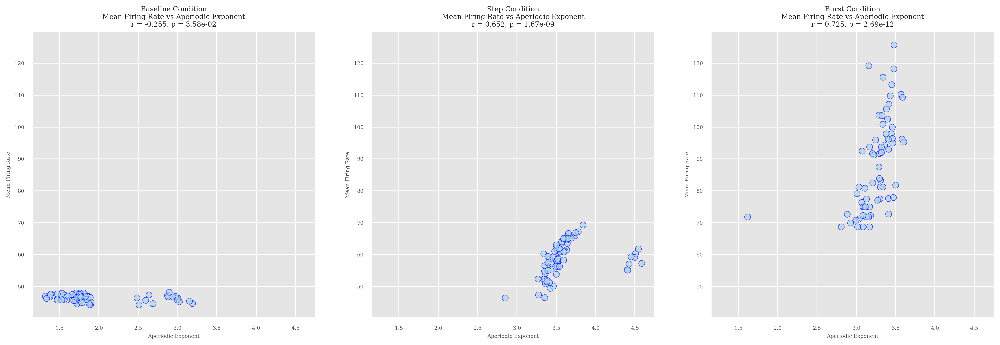

In [20]:
# mean firing rate vs aperiodic exponent
conditions = ['baseline', 'step', 'burst']
data_conditions = [foof_features_baseline, foof_features_step, foof_features_burst]
fig, axs = plt.subplots(1, 3, figsize=(20, 6), dpi=300)

for ax, condition, data in zip(axs, conditions, data_conditions):
    y = data['Mean_Firing_Rate']
    x = data['Aperiodic_Exponent']
    r, p = stats.spearmanr(x, y)
    sns.scatterplot(data=data, x='Aperiodic_Exponent', y='Mean_Firing_Rate', ax=ax, color='lightblue', edgecolor='blue', s=50, alpha=0.7)
    ax.set_title(f"{condition.capitalize()} Condition\nMean Firing Rate vs Aperiodic Exponent\nr = {r:.3f}, p = {p:.2e}")
    ax.set_xlabel("Aperiodic Exponent")
    ax.set_ylabel("Mean Firing Rate")
    ax.sharey(axs[2])
    ax.sharex(axs[1])

plt.show()

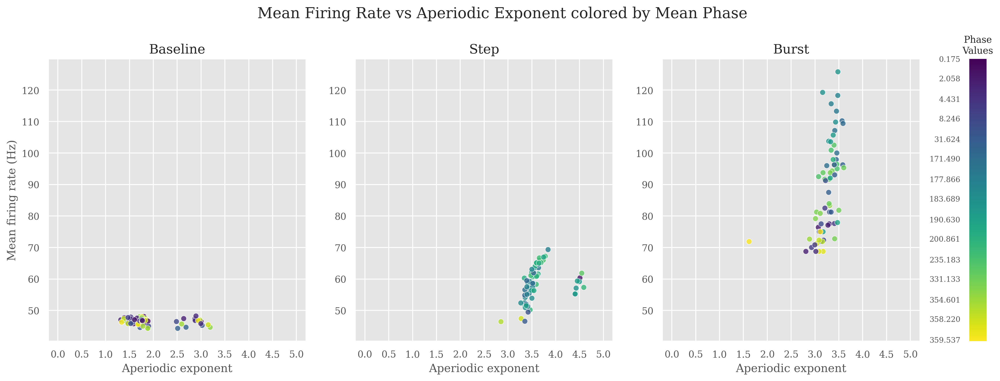

In [21]:
fig = plt.figure(figsize=(15, 6), dpi=300)
gs_phase = GridSpec(1, 4, figure=fig, 
                    width_ratios=[3, 3, 3, 0.2],  
                    left=0.05, right=0.98, top=0.85, bottom=0.15, 
                    wspace=0.25)  

ax1 = fig.add_subplot(gs_phase[0, 0])
ax2 = fig.add_subplot(gs_phase[0, 1], sharey=ax1)
ax3 = fig.add_subplot(gs_phase[0, 2], sharey=ax1)
ax_heatmap = fig.add_subplot(gs_phase[0, 3])

sns.scatterplot(data=foof_features_baseline, x="Aperiodic_Exponent", y="Mean_Firing_Rate", 
                ax=ax1, s=35, alpha=0.8, hue='Mean_Phase', palette=colors_phase_raw)
ax1.set_title("Baseline", fontsize=14)

sns.scatterplot(data=foof_features_step, x="Aperiodic_Exponent", y="Mean_Firing_Rate", 
                ax=ax2, s=35, alpha=0.8, hue='Mean_Phase', palette=colors_phase_raw)
ax2.set_title("Step", fontsize=14)

sns.scatterplot(data=foof_features_burst, x="Aperiodic_Exponent", y="Mean_Firing_Rate", 
                ax=ax3, s=35, alpha=0.8, hue='Mean_Phase', palette=colors_phase_raw)
ax3.set_title("Burst", fontsize=14)


sns.heatmap(data=phase_labels_data, ax=ax_heatmap, cmap=mcolors.ListedColormap(phase_colors), 
            cbar=False, yticklabels=phase_labels_display, 
            xticklabels=False)
ax_heatmap.set_title("Phase\nValues", fontsize=10)
ax_heatmap.tick_params(axis='y', labelsize=8)

ax1.set_ylabel("Mean firing rate (Hz)", fontsize=12)
ax2.set_ylabel("", fontsize=12)
ax3.set_ylabel("", fontsize=12)

for ax in [ax1, ax2, ax3]:
    ax.set_xlabel("Aperiodic exponent", fontsize=12)
    ax.set_xlim(-0.2, 5.2) 
    ax.set_xticks(np.arange(0, 5.5, 0.5))
    ax.tick_params(axis='both', which='major', labelsize=10)

for ax in [ax1, ax2, ax3]:
    if ax.get_legend():
        ax.get_legend().remove()

fig.suptitle("Mean Firing Rate vs Aperiodic Exponent colored by Mean Phase", fontsize=16)
plt.show()

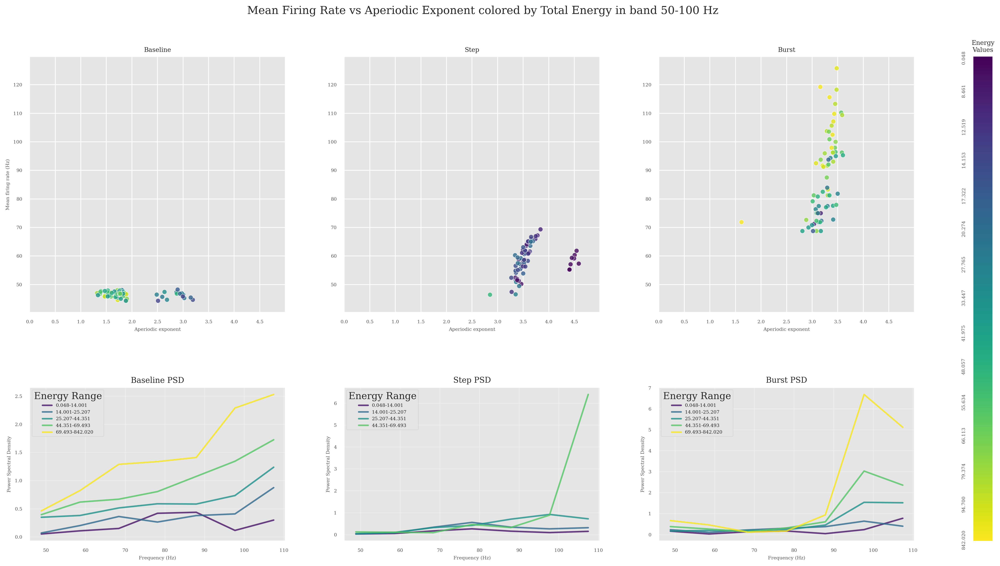

In [22]:
fig = plt.figure(figsize=(20, 15), dpi=300)
gs = GridSpec(3, 4, figure=fig, 
              height_ratios=[1, 0.6, 0.6],
              width_ratios=[2, 2, 2, 0.15],
              left=0.1, right=0.95, top=0.92, bottom=0.08, 
              wspace=0.3, hspace=0.4)

ax1 = fig.add_subplot(gs[0, 0])  
ax2 = fig.add_subplot(gs[0, 1], sharey=ax1)  
ax3 = fig.add_subplot(gs[0, 2], sharey=ax1)
ax_heatmap = fig.add_subplot(gs[0:2, 3]) 

sns.scatterplot(data=foof_features_baseline, x="Aperiodic_Exponent", y="Mean_Firing_Rate", 
                ax=ax1, s=35, alpha=0.8, hue='Total_Energy', palette=colors_energy_raw)
ax1.set_title("Baseline")

sns.scatterplot(data=foof_features_step, x="Aperiodic_Exponent", y="Mean_Firing_Rate", 
                ax=ax2, s=35, alpha=0.8, hue='Total_Energy', palette=colors_energy_raw)
ax2.set_title("Step")

sns.scatterplot(data=foof_features_burst, x="Aperiodic_Exponent", y="Mean_Firing_Rate", 
                ax=ax3, s=35, alpha=0.8, hue='Total_Energy', palette=colors_energy_raw)
ax3.set_title("Burst")

sns.heatmap(data=energy_labels_data, ax=ax_heatmap, cmap=mcolors.ListedColormap(energy_colors), 
            cbar=False, yticklabels=energy_labels_display, 
            xticklabels=False)
ax_heatmap.set_title("Energy\nValues", fontsize=8)
ax_heatmap.tick_params(axis='y', labelsize=6)

ax1.set_ylabel("Mean firing rate (Hz)")
ax2.set_ylabel("")
ax3.set_ylabel("")

for ax in [ax1, ax2, ax3]:
    ax.set_xlabel("Aperiodic exponent")
    ax.set_xlim(0, 5.0)
    ax.set_xticks(np.arange(0, 5, 0.5))


ax_psd_baseline = fig.add_subplot(gs[1, 0])
ax_psd_step = fig.add_subplot(gs[1, 1])
ax_psd_burst = fig.add_subplot(gs[1, 2])

ax_psd_baseline2 = fig.add_subplot(gs[2, 0])
ax_psd_step2 = fig.add_subplot(gs[2, 1])
ax_psd_burst2 = fig.add_subplot(gs[2, 2])

freqs_baseline = [float(col.split('Hz')[0]) for col in psdPC_baseline.columns]
freqs_step = [float(col.split('Hz')[0]) for col in psdPC_step.columns]
freqs_burst = [float(col.split('Hz')[0]) for col in psdPC_burst.columns]

n_quantiles = 5
quantiles = np.quantile(energy_unique, np.linspace(0, 1, n_quantiles + 1))

for i in range(n_quantiles):
    q_low, q_high = quantiles[i], quantiles[i + 1]
    
    mid_energy = (q_low + q_high) / 2
    closest_energy = min(energy_unique, key=lambda x: abs(x - mid_energy))
    
    # Baseline PSD
    neurons_in_bin_baseline = foof_features_baseline[
        (foof_features_baseline['Total_Energy'] >= q_low) & 
        (foof_features_baseline['Total_Energy'] < q_high)
    ].index
    
    if len(neurons_in_bin_baseline) > 0:
        psd_subset = psdPC_baseline.iloc[neurons_in_bin_baseline]
        avg_psd = psd_subset.mean(axis=0)
        ax_psd_baseline.plot(freqs_baseline, avg_psd, color=colors_energy_raw[closest_energy], 
                            label=f'{q_low:.3f}-{q_high:.3f}', alpha=0.8, linewidth=2)
    
    # Step PSD
    neurons_in_bin_step = foof_features_step[
        (foof_features_step['Total_Energy'] >= q_low) & 
        (foof_features_step['Total_Energy'] < q_high)
    ].index
    
    if len(neurons_in_bin_step) > 0:
        psd_subset = psdPC_step.iloc[neurons_in_bin_step]
        avg_psd = psd_subset.mean(axis=0)
        ax_psd_step.plot(freqs_step, avg_psd, color=colors_energy_raw[closest_energy], 
                        label=f'{q_low:.3f}-{q_high:.3f}', alpha=0.8, linewidth=2)
    
    # Burst PSD
    neurons_in_bin_burst = foof_features_burst[
        (foof_features_burst['Total_Energy'] >= q_low) & 
        (foof_features_burst['Total_Energy'] < q_high)
    ].index
    
    if len(neurons_in_bin_burst) > 0:
        psd_subset = psdPC_burst.iloc[neurons_in_bin_burst]
        avg_psd = psd_subset.mean(axis=0)
        ax_psd_burst.plot(freqs_burst, avg_psd, color=colors_energy_raw[closest_energy], 
                         label=f'{q_low:.3f}-{q_high:.3f}', alpha=0.8, linewidth=2)

for ax, title in zip([ax_psd_baseline, ax_psd_step, ax_psd_burst], 
                     ['Baseline PSD', 'Step PSD', 'Burst PSD']):
    ax.set_xlabel('Frequency (Hz)')
    ax.set_ylabel('Power Spectral Density')
    ax.set_title(title, fontsize=10)
    ax.grid(True, alpha=0.3)
    ax.legend(fontsize=6, title='Energy Range')

for ax in [ax_psd_baseline2, ax_psd_step2, ax_psd_burst2]:
    ax.set_visible(False)

for ax in [ax1, ax2, ax3]:
    if ax.get_legend():
        ax.get_legend().remove()

fig.suptitle("Mean Firing Rate vs Aperiodic Exponent colored by Total Energy in band 50-100 Hz", fontsize=14)
plt.show()

/tmp/ipykernel_43219/3520449977.py:188: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


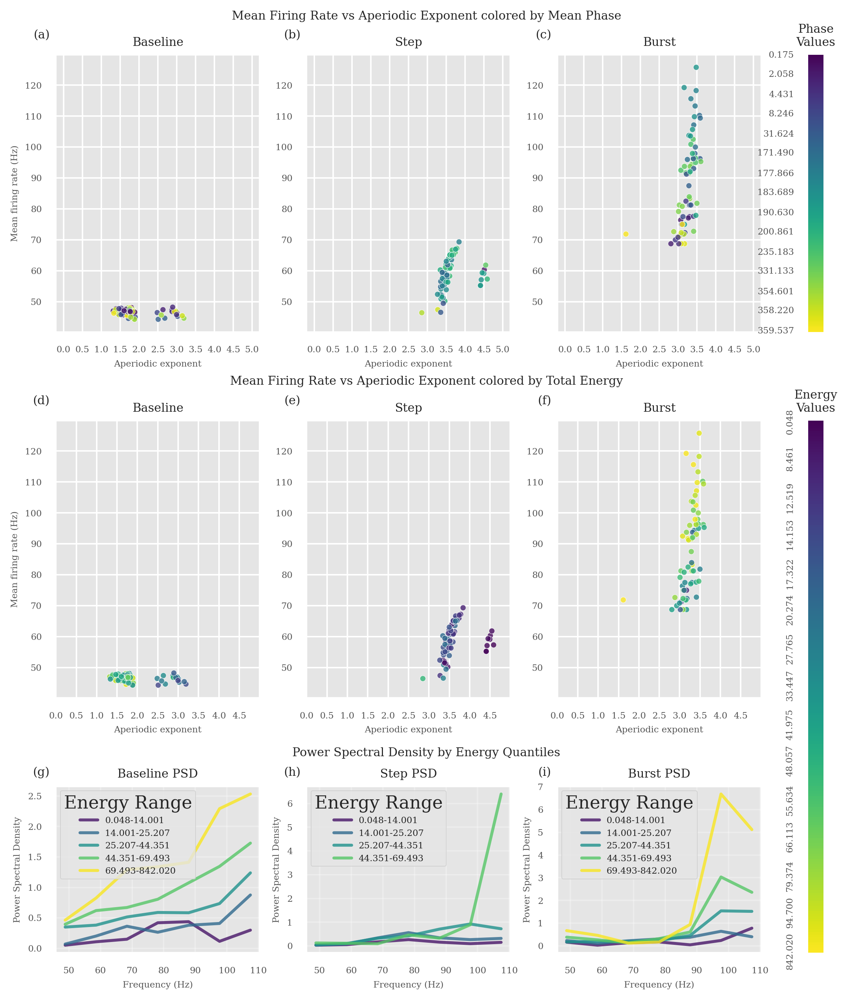

In [ ]:
## FINAL PLOT WITH COMBINED FIGURE AND LETTERS

# Combined figure with Mean Phase (top) and Energy + PSD (bottom)
fig = plt.figure(figsize=(8.27, 12), dpi=300)
gs = GridSpec(4, 4, figure=fig, 
              height_ratios=[1, 1, 0.6, 0.6],  # Phase row, Energy row, PSD row 1, PSD row 2
              width_ratios=[2, 2, 2, 0.15],
              left=0.08, right=0.95, top=0.95, bottom=0.05, 
              wspace=0.3, hspace=0.4)

# Top mean phase plots 
ax1_phase = fig.add_subplot(gs[0, 0])
ax2_phase = fig.add_subplot(gs[0, 1], sharey=ax1_phase)
ax3_phase = fig.add_subplot(gs[0, 2], sharey=ax1_phase)
ax_heatmap_phase = fig.add_subplot(gs[0, 3])

sns.scatterplot(data=foof_features_baseline, x="Aperiodic_Exponent", y="Mean_Firing_Rate", 
                ax=ax1_phase, s=15, alpha=0.8, hue='Mean_Phase', palette=colors_phase_raw)
ax1_phase.set_title("Baseline")

sns.scatterplot(data=foof_features_step, x="Aperiodic_Exponent", y="Mean_Firing_Rate", 
                ax=ax2_phase, s=15, alpha=0.8, hue='Mean_Phase', palette=colors_phase_raw)
ax2_phase.set_title("Step")

sns.scatterplot(data=foof_features_burst, x="Aperiodic_Exponent", y="Mean_Firing_Rate", 
                ax=ax3_phase, s=15, alpha=0.8, hue='Mean_Phase', palette=colors_phase_raw)
ax3_phase.set_title("Burst")

# Phase heatmap
sns.heatmap(data=phase_labels_data, ax=ax_heatmap_phase, 
            cmap=mcolors.ListedColormap(phase_colors), 
            cbar=False, yticklabels=phase_labels_display, 
            xticklabels=False)
ax_heatmap_phase.set_title("Phase\nValues")
ax_heatmap_phase.tick_params(axis='y')

ax1_phase.set_ylabel("Mean firing rate (Hz)")
ax2_phase.set_ylabel("")
ax3_phase.set_ylabel("")

for ax in [ax1_phase, ax2_phase, ax3_phase]:
    ax.set_xlabel("Aperiodic exponent")
    ax.set_xlim(-0.2, 5.2)
    ax.set_xticks(np.arange(0, 5.5, 0.5))
    ax.tick_params(axis='both', which='major')
    if ax.get_legend():
        ax.get_legend().remove()

ax1_phase.text(-0.03, 1.05, '(a)', transform=ax1_phase.transAxes, va='bottom', ha='right')
ax2_phase.text(-0.03, 1.05, '(b)', transform=ax2_phase.transAxes, va='bottom', ha='right')
ax3_phase.text(-0.03, 1.05, '(c)', transform=ax3_phase.transAxes, va='bottom', ha='right')

# Energy plots
ax1_energy = fig.add_subplot(gs[1, 0])
ax2_energy = fig.add_subplot(gs[1, 1], sharey=ax1_energy)
ax3_energy = fig.add_subplot(gs[1, 2], sharey=ax1_energy)
ax_heatmap_energy = fig.add_subplot(gs[1:3, 3]) 

sns.scatterplot(data=foof_features_baseline, x="Aperiodic_Exponent", y="Mean_Firing_Rate", 
                ax=ax1_energy, s=15, alpha=0.8, hue='Total_Energy', palette=colors_energy_raw)
ax1_energy.set_title("Baseline")

sns.scatterplot(data=foof_features_step, x="Aperiodic_Exponent", y="Mean_Firing_Rate", 
                ax=ax2_energy, s=15, alpha=0.8, hue='Total_Energy', palette=colors_energy_raw)
ax2_energy.set_title("Step")


sns.scatterplot(data=foof_features_burst, x="Aperiodic_Exponent", y="Mean_Firing_Rate", 
                ax=ax3_energy, s=15, alpha=0.8, hue='Total_Energy', palette=colors_energy_raw)
ax3_energy.set_title("Burst")

# Energy heatmap
sns.heatmap(data=energy_labels_data, ax=ax_heatmap_energy, 
            cmap=mcolors.ListedColormap(energy_colors), 
            cbar=False, yticklabels=energy_labels_display, 
            xticklabels=False)
ax_heatmap_energy.set_title("Energy\nValues")
ax_heatmap_energy.tick_params(axis='y')

# Energy plot formatting
ax1_energy.set_ylabel("Mean firing rate (Hz)")
ax2_energy.set_ylabel("")
ax3_energy.set_ylabel("")

for ax in [ax1_energy, ax2_energy, ax3_energy]:
    ax.set_xlabel("Aperiodic exponent")
    ax.set_xlim(0, 5.0)
    ax.set_xticks(np.arange(0, 5, 0.5))
    ax.tick_params(axis='both', which='major')
    if ax.get_legend():
        ax.get_legend().remove()

ax1_energy.text(-0.03, 1.05, '(d)', transform=ax1_energy.transAxes, va='bottom', ha='right')
ax2_energy.text(-0.03, 1.05, '(e)', transform=ax2_energy.transAxes, va='bottom', ha='right')
ax3_energy.text(-0.03, 1.05, '(f)', transform=ax3_energy.transAxes, va='bottom', ha='right')

# PSD plots
ax_psd_baseline = fig.add_subplot(gs[2, 0])
ax_psd_step = fig.add_subplot(gs[2, 1])
ax_psd_burst = fig.add_subplot(gs[2, 2])

ax_psd_baseline2 = fig.add_subplot(gs[3, 0])
ax_psd_step2 = fig.add_subplot(gs[3, 1])
ax_psd_burst2 = fig.add_subplot(gs[3, 2])

freqs_baseline = [float(col.split('Hz')[0]) for col in psdPC_baseline.columns]
freqs_step = [float(col.split('Hz')[0]) for col in psdPC_step.columns]
freqs_burst = [float(col.split('Hz')[0]) for col in psdPC_burst.columns]

# Plot PSD by energy quantiles
n_quantiles = 5
quantiles = np.quantile(energy_unique, np.linspace(0, 1, n_quantiles + 1))

for i in range(n_quantiles):
    q_low, q_high = quantiles[i], quantiles[i + 1]
    
    mid_energy = (q_low + q_high) / 2
    closest_energy = min(energy_unique, key=lambda x: abs(x - mid_energy))
    
    # Baseline PSD
    neurons_in_bin_baseline = foof_features_baseline[
        (foof_features_baseline['Total_Energy'] >= q_low) & 
        (foof_features_baseline['Total_Energy'] < q_high)
    ].index
    
    if len(neurons_in_bin_baseline) > 0:
        psd_subset = psdPC_baseline.iloc[neurons_in_bin_baseline]
        avg_psd = psd_subset.mean(axis=0)
        ax_psd_baseline.plot(freqs_baseline, avg_psd, color=colors_energy_raw[closest_energy], 
                            label=f'{q_low:.3f}-{q_high:.3f}', alpha=0.8, linewidth=2)
    
    # Step PSD
    neurons_in_bin_step = foof_features_step[
        (foof_features_step['Total_Energy'] >= q_low) & 
        (foof_features_step['Total_Energy'] < q_high)
    ].index
    
    if len(neurons_in_bin_step) > 0:
        psd_subset = psdPC_step.iloc[neurons_in_bin_step]
        avg_psd = psd_subset.mean(axis=0)
        ax_psd_step.plot(freqs_step, avg_psd, color=colors_energy_raw[closest_energy], 
                        label=f'{q_low:.3f}-{q_high:.3f}', alpha=0.8, linewidth=2)
    
    # Burst PSD
    neurons_in_bin_burst = foof_features_burst[
        (foof_features_burst['Total_Energy'] >= q_low) & 
        (foof_features_burst['Total_Energy'] < q_high)
    ].index
    
    if len(neurons_in_bin_burst) > 0:
        psd_subset = psdPC_burst.iloc[neurons_in_bin_burst]
        avg_psd = psd_subset.mean(axis=0)
        ax_psd_burst.plot(freqs_burst, avg_psd, color=colors_energy_raw[closest_energy], 
                         label=f'{q_low:.3f}-{q_high:.3f}', alpha=0.8, linewidth=2)

for ax, title in zip([ax_psd_baseline, ax_psd_step, ax_psd_burst], 
                     ['Baseline PSD', 'Step PSD', 'Burst PSD']):
    ax.set_xlabel('Frequency (Hz)')
    ax.set_ylabel('Power Spectral Density')
    ax.set_title(title)
    ax.grid(True, alpha=0.3)
    ax.legend(title='Energy Range', fontsize=6)
    ax.tick_params(axis='both', which='major')

# Add panel labels for PSD row
ax_psd_baseline.text(-0.03, 1.05, '(g)', transform=ax_psd_baseline.transAxes, va='bottom', ha='right')
ax_psd_step.text(-0.03, 1.05, '(h)', transform=ax_psd_step.transAxes, va='bottom', ha='right')
ax_psd_burst.text(-0.03, 1.05, '(i)', transform=ax_psd_burst.transAxes, va='bottom', ha='right')

for ax in [ax_psd_baseline2, ax_psd_step2, ax_psd_burst2]:
    ax.set_visible(False)

# Add section titles
fig.text(0.5, 0.98, "Mean Firing Rate vs Aperiodic Exponent colored by Mean Phase", 
         ha='center', va='center')
fig.text(0.5, 0.695, "Mean Firing Rate vs Aperiodic Exponent colored by Total Energy", 
         ha='center', va='center')
fig.text(0.5, 0.405, "Power Spectral Density by Energy Quantiles", ha='center', va='center')

plt.tight_layout()
plt.show()

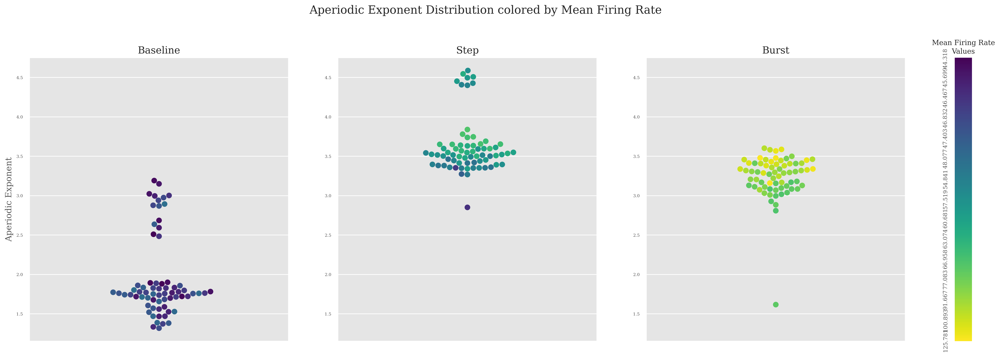

In [24]:
fig = plt.figure(figsize=(20, 8), dpi=300) 
gs_phase = GridSpec(1, 4, figure=fig, 
                    width_ratios=[3, 3, 3, 0.2], 
                    left=0.05, right=0.98, top=0.85, bottom=0.15, 
                    wspace=0.25) 

ax1 = fig.add_subplot(gs_phase[0, 0])
ax2 = fig.add_subplot(gs_phase[0, 1], sharey=ax1)
ax3 = fig.add_subplot(gs_phase[0, 2], sharey=ax1)
ax_heatmap = fig.add_subplot(gs_phase[0, 3])

sns.swarmplot(data=foof_features_baseline, y='Aperiodic_Exponent', 
              hue='Mean_Firing_Rate', palette=colors_mean_fr_raw, ax=ax1, size=8)  # Increased point size
ax1.set_title('Baseline', fontsize=14)
ax1.set_xlabel('')  
ax1.set_ylabel('Aperiodic Exponent')

sns.swarmplot(data=foof_features_step, y='Aperiodic_Exponent', 
              hue='Mean_Firing_Rate', palette=colors_mean_fr_raw, ax=ax2, size=8)
ax2.set_title('Step', fontsize=14)

sns.swarmplot(data=foof_features_burst, y='Aperiodic_Exponent', 
              hue='Mean_Firing_Rate', palette=colors_mean_fr_raw, ax=ax3, size=8)
ax3.set_title('Burst', fontsize=14)

sns.heatmap(data=mean_fr_labels_data, ax=ax_heatmap, cmap=mcolors.ListedColormap(mean_fr_colors), 
            cbar=False, yticklabels=mean_fr_labels_display, 
            xticklabels=False)
ax_heatmap.set_title("Mean Firing Rate\nValues", fontsize=10)
ax_heatmap.tick_params(axis='y', labelsize=8)

ax1.set_ylabel("Aperiodic Exponent", fontsize=12)
ax2.set_ylabel("", fontsize=12)
ax3.set_ylabel("", fontsize=12)

for ax in [ax1, ax2, ax3]:
    ax.set_xlabel('', fontsize=12) 
    ax.set_xlim(-0.3, 0.3)
    if ax.get_legend():
        ax.get_legend().remove()

fig.suptitle("Aperiodic Exponent Distribution colored by Mean Firing Rate", fontsize=16)
plt.show()

In [ ]:
def chi_square_test(data):
    q33 = data['Aperiodic_Exponent'].quantile(0.33)
    q67 = data['Aperiodic_Exponent'].quantile(0.67)
    
    data['Exponent_Bin'] = pd.cut(data['Aperiodic_Exponent'], 
                                  bins=[-np.inf, q33, q67, np.inf], 
                                  labels=['Low', 'Medium', 'High'])
    
    # Create contingency table and test
    contingency_table = pd.crosstab(data['Cluster'], data['Exponent_Bin'])
    
    if contingency_table.size > 0 and (contingency_table >= 5).all().all():
        chi2_stat, p_val, dof, expected = chi2_contingency(contingency_table)
        return chi2_stat, p_val
    else:
        return np.nan, np.nan

/tmp/ipykernel_43219/1600242544.py:80: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


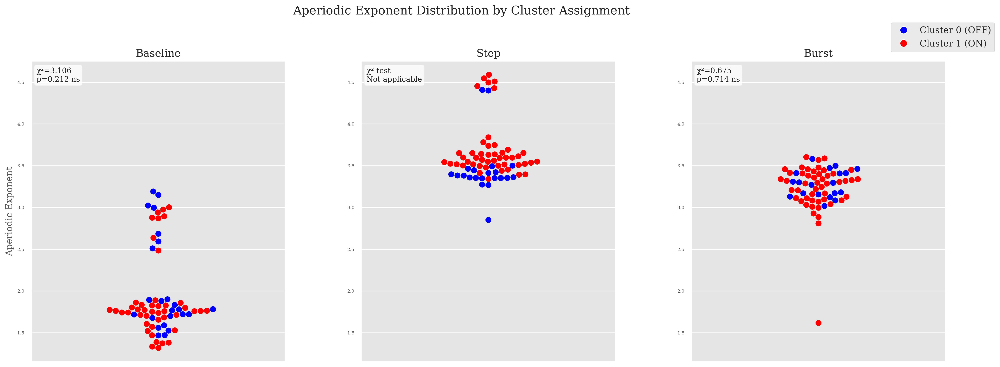

In [ ]:
from scipy.stats import chi2_contingency

clusters_baseline = corr_results_baseline['Cluster'].values
clusters_step = corr_results_step['Cluster'].values
clusters_burst = corr_results_burst['Cluster'].values

clusters_colors = {0: 'blue', 1: 'red'}

foof_features_baseline_clusters = foof_features_baseline.copy()
foof_features_baseline_clusters['Cluster'] = clusters_baseline

foof_features_step_clusters = foof_features_step.copy()
foof_features_step_clusters['Cluster'] = clusters_step

foof_features_burst_clusters = foof_features_burst.copy()
foof_features_burst_clusters['Cluster'] = clusters_burst


datasets = [
    (foof_features_baseline_clusters, 'Baseline'),
    (foof_features_step_clusters, 'Step'),
    (foof_features_burst_clusters, 'Burst')
]

fig = plt.figure(figsize=(20, 8), dpi=300)
gs = GridSpec(1, 3, figure=fig, width_ratios=[1, 1, 1], 
              left=0.1, right=0.95, top=0.85, bottom=0.15, wspace=0.3)

axes = [fig.add_subplot(gs[0, i]) for i in range(3)]

for i, (data, condition) in enumerate(datasets):
    ax = axes[i]
    
    chi2_stat, p_val = chi_square_test(data)

    sns.swarmplot(data=data, y='Aperiodic_Exponent', 
                  hue='Cluster', palette=clusters_colors, ax=ax, size=8)
    
    ax.set_title(condition, fontsize=14)
    ax.set_xlabel('')
    if i == 0:
        ax.set_ylabel('Aperiodic Exponent', fontsize=12)
    else:
        ax.set_ylabel('')
    
    if not np.isnan(chi2_stat):
        p_text = f"p={p_val:.3f}" if p_val >= 0.001 else "p<0.001"
        significance = "***" if p_val < 0.001 else "**" if p_val < 0.01 else "*" if p_val < 0.05 else "ns"
        
        ax.text(0.02, 0.98, f"χ²={chi2_stat:.3f}\n{p_text} {significance}", 
                transform=ax.transAxes, verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8),
                fontsize=10)
    else:
        ax.text(0.02, 0.98, "χ² test\nNot applicable", 
                transform=ax.transAxes, verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8),
                fontsize=10)
    
    ax.set_xlim(-0.3, 0.3)
    if ax.get_legend():
        ax.get_legend().remove()
        ax.sharey(axes[1])

# Add legend
legend_elements = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=clusters_colors[0], 
                             markersize=10, label='Cluster 0 (OFF)', linestyle='None'),
                  plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=clusters_colors[1], 
                             markersize=10, label='Cluster 1 (ON)', linestyle='None')]

fig.legend(handles=legend_elements, loc='upper right', bbox_to_anchor=(1.0, 0.95), fontsize=12)
fig.suptitle("Aperiodic Exponent Distribution by Cluster Assignment", fontsize=16)

plt.tight_layout()
plt.show()


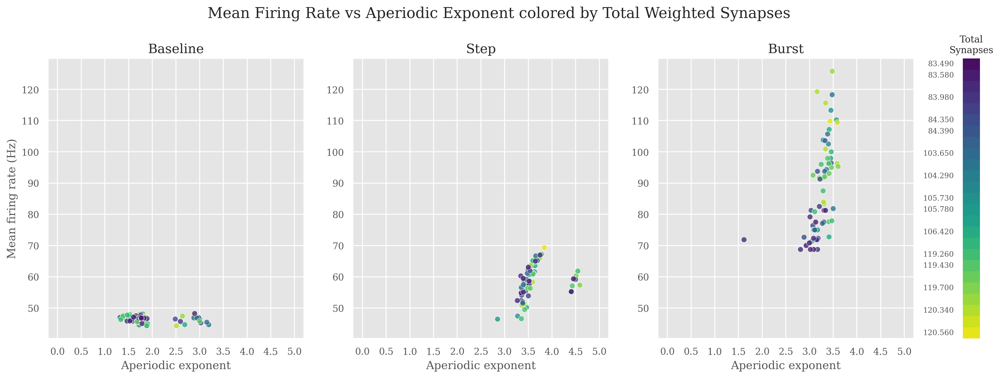

In [27]:
fig = plt.figure(figsize=(15, 6), dpi=300)
gs_phase = GridSpec(1, 4, figure=fig, 
                    width_ratios=[3, 3, 3, 0.2],  
                    left=0.05, right=0.98, top=0.85, bottom=0.15, 
                    wspace=0.25)  

ax1 = fig.add_subplot(gs_phase[0, 0])
ax2 = fig.add_subplot(gs_phase[0, 1], sharey=ax1)
ax3 = fig.add_subplot(gs_phase[0, 2], sharey=ax1)
ax_heatmap = fig.add_subplot(gs_phase[0, 3])

sns.scatterplot(data=foof_features_baseline, x="Aperiodic_Exponent", y="Mean_Firing_Rate", 
                ax=ax1, s=35, alpha=0.8, hue='Total_Weighted_Synapses', palette=synapse_raw)
ax1.set_title("Baseline", fontsize=14)

sns.scatterplot(data=foof_features_step, x="Aperiodic_Exponent", y="Mean_Firing_Rate", 
                ax=ax2, s=35, alpha=0.8, hue='Total_Weighted_Synapses', palette=synapse_raw)
ax2.set_title("Step", fontsize=14)

sns.scatterplot(data=foof_features_burst, x="Aperiodic_Exponent", y="Mean_Firing_Rate", 
                ax=ax3, s=35, alpha=0.8, hue='Total_Weighted_Synapses', palette=synapse_raw)
ax3.set_title("Burst", fontsize=14)


sns.heatmap(data=synapse_labels_data, ax=ax_heatmap, cmap=mcolors.ListedColormap(synapse_colors), 
            cbar=False, yticklabels=synapse_labels_display, 
            xticklabels=False)
ax_heatmap.set_title("Total\nSynapses", fontsize=10)
ax_heatmap.tick_params(axis='y', labelsize=8)

ax1.set_ylabel("Mean firing rate (Hz)", fontsize=12)
ax2.set_ylabel("", fontsize=12)
ax3.set_ylabel("", fontsize=12)

for ax in [ax1, ax2, ax3]:
    ax.set_xlabel("Aperiodic exponent", fontsize=12)
    ax.set_xlim(-0.2, 5.2) 
    ax.set_xticks(np.arange(0, 5.5, 0.5))
    ax.tick_params(axis='both', which='major', labelsize=10)

for ax in [ax1, ax2, ax3]:
    if ax.get_legend():
        ax.get_legend().remove()

fig.suptitle("Mean Firing Rate vs Aperiodic Exponent colored by Total Weighted Synapses", fontsize=16)
plt.show()


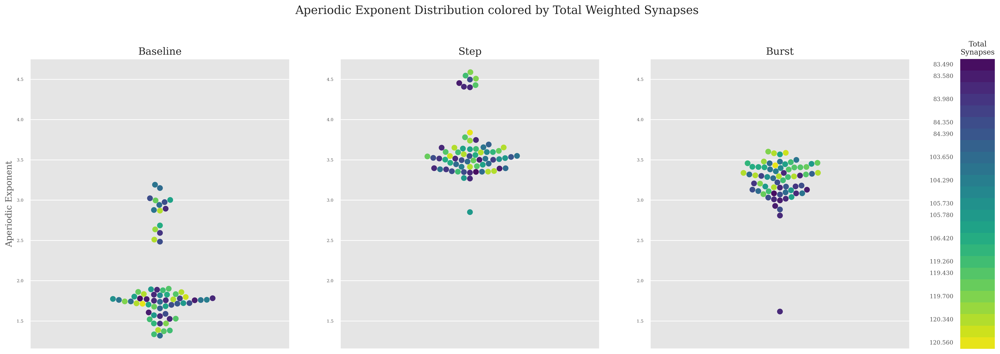

In [28]:
fig = plt.figure(figsize=(20, 8), dpi=300) 
gs_phase = GridSpec(1, 4, figure=fig, 
                    width_ratios=[3, 3, 3, 0.4],  
                    left=0.05, right=0.98, top=0.85, bottom=0.15, 
                    wspace=0.25) 

ax1 = fig.add_subplot(gs_phase[0, 0])
ax2 = fig.add_subplot(gs_phase[0, 1], sharey=ax1)
ax3 = fig.add_subplot(gs_phase[0, 2], sharey=ax1)
ax_heatmap = fig.add_subplot(gs_phase[0, 3])

sns.swarmplot(data=foof_features_baseline, y='Aperiodic_Exponent', 
              hue='Total_Weighted_Synapses', palette=synapse_raw, ax=ax1, size=8) 
ax1.set_title('Baseline', fontsize=14)
ax1.set_xlabel('')  
ax1.set_ylabel('Aperiodic Exponent')

sns.swarmplot(data=foof_features_step, y='Aperiodic_Exponent', 
              hue='Total_Weighted_Synapses', palette=synapse_raw, ax=ax2, size=8)
ax2.set_title('Step', fontsize=14)

sns.swarmplot(data=foof_features_burst, y='Aperiodic_Exponent', 
              hue='Total_Weighted_Synapses', palette=synapse_raw, ax=ax3, size=8)
ax3.set_title('Burst', fontsize=14)

sns.heatmap(data=synapse_labels_data, ax=ax_heatmap, cmap=mcolors.ListedColormap(synapse_colors), 
            cbar=False, yticklabels=synapse_labels_display, 
            xticklabels=False)
ax_heatmap.set_title("Total\nSynapses", fontsize=10)
ax_heatmap.tick_params(axis='y', labelsize=8)

ax1.set_ylabel("Aperiodic Exponent", fontsize=12)
ax2.set_ylabel("", fontsize=12)
ax3.set_ylabel("", fontsize=12)

for ax in [ax1, ax2, ax3]:
    ax.set_xlabel('', fontsize=12)  
    ax.set_xlim(-0.3, 0.3)  
    if ax.get_legend():
        ax.get_legend().remove()

fig.suptitle("Aperiodic Exponent Distribution colored by Total Weighted Synapses", fontsize=16)
plt.show()

/home/nix/miniconda3/envs/pytorch_env/lib/python3.12/site-packages/seaborn/categorical.py:3399: UserWarning: 8.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/nix/miniconda3/envs/pytorch_env/lib/python3.12/site-packages/seaborn/categorical.py:3399: UserWarning: 8.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


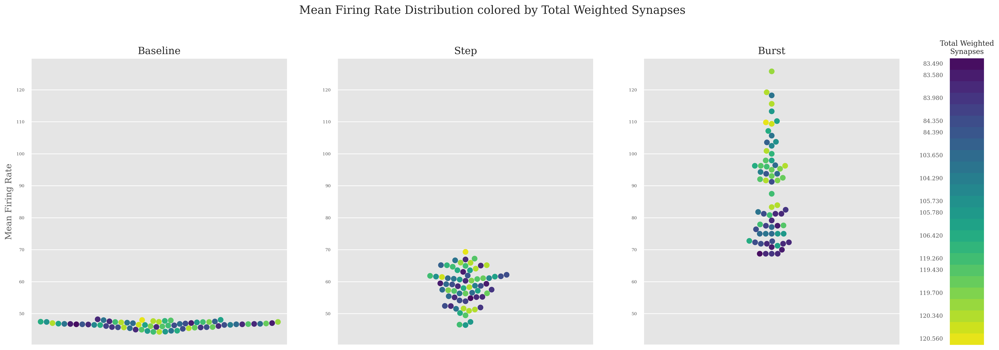

In [29]:
fig = plt.figure(figsize=(20, 8), dpi=300) 
gs_phase = GridSpec(1, 4, figure=fig, 
                    width_ratios=[3, 3, 3, 0.4],  
                    left=0.05, right=0.98, top=0.85, bottom=0.15, 
                    wspace=0.25) 

ax1 = fig.add_subplot(gs_phase[0, 0])
ax2 = fig.add_subplot(gs_phase[0, 1], sharey=ax1)
ax3 = fig.add_subplot(gs_phase[0, 2], sharey=ax1)
ax_heatmap = fig.add_subplot(gs_phase[0, 3])

sns.swarmplot(data=foof_features_baseline, y='Mean_Firing_Rate', 
              hue='Total_Weighted_Synapses', palette=synapse_raw, ax=ax1, size=8) 
ax1.set_title('Baseline', fontsize=14)
ax1.set_xlabel('')  
ax1.set_ylabel('Mean Firing Rate')

sns.swarmplot(data=foof_features_step, y='Mean_Firing_Rate', 
              hue='Total_Weighted_Synapses', palette=synapse_raw, ax=ax2, size=8)
ax2.set_title('Step', fontsize=14)

sns.swarmplot(data=foof_features_burst, y='Mean_Firing_Rate', 
              hue='Total_Weighted_Synapses', palette=synapse_raw, ax=ax3, size=8)
ax3.set_title('Burst', fontsize=14)

sns.heatmap(data=synapse_labels_data, ax=ax_heatmap, cmap=mcolors.ListedColormap(synapse_colors), 
            cbar=False, yticklabels=synapse_labels_display, 
            xticklabels=False)
ax_heatmap.set_title("Total Weighted\nSynapses", fontsize=10)
ax_heatmap.tick_params(axis='y', labelsize=8)

ax1.set_ylabel("Mean Firing Rate", fontsize=12)
ax2.set_ylabel("", fontsize=12)
ax3.set_ylabel("", fontsize=12)

for ax in [ax1, ax2, ax3]:
    ax.set_xlabel('', fontsize=12)  
    ax.set_xlim(-0.3, 0.3)  
    if ax.get_legend():
        ax.get_legend().remove()

fig.suptitle("Mean Firing Rate Distribution colored by Total Weighted Synapses", fontsize=16)
plt.show()

In [30]:
from scipy.stats import chi2_contingency

clusters_baseline = corr_results_baseline['Cluster'].values
clusters_step = corr_results_step['Cluster'].values
clusters_burst = corr_results_burst['Cluster'].values

clusters_colors = {0: 'blue', 1: 'red'}

# Add clusters to dataframes
foof_features_baseline_clusters = foof_features_baseline.copy()
foof_features_baseline_clusters['Cluster'] = clusters_baseline

foof_features_step_clusters = foof_features_step.copy()
foof_features_step_clusters['Cluster'] = clusters_step

foof_features_burst_clusters = foof_features_burst.copy()
foof_features_burst_clusters['Cluster'] = clusters_burst

In [31]:
corr_results_baseline

,pop_correlation,pc_rate_exp_corr,corr_strength_exp_relation,pc_MLI_correlations,exponents,Cluster,cell_id
0,0.561465,-0.255008,-0.201473,0.067339,1.827419,1,1
1,0.561465,-0.255008,-0.201473,0.048030,2.686008,0,2
2,0.561465,-0.255008,-0.201473,0.097554,1.703779,1,3
3,0.561465,-0.255008,-0.201473,0.068103,3.002476,1,4
4,0.561465,-0.255008,-0.201473,0.106619,1.803043,1,5
...,...,...,...,...,...,...,...
63,0.561465,-0.255008,-0.201473,0.088223,1.782917,0,64
64,0.561465,-0.255008,-0.201473,0.088708,1.526516,0,65
65,0.561465,-0.255008,-0.201473,0.139142,1.757581,1,66
66,0.561465,-0.255008,-0.201473,0.078609,1.771607,1,67


In [32]:
def plot_pc_MLI_vs_exponent(results, clusters_pc=None, regression=False, ax=None):
    """
    Plot the relationship between PC-MLI correlations and aperiodic exponents
    """
    pc_MLI_correlations = results['pc_MLI_correlations']
    exponents = results['exponents']

    if ax is not None:
        axes = ax
    else:
        fig, axes = plt.subplots(1, 2, figsize=(15, 6), dpi=300)

    # Scatter plot of all neurons
    axes[0].scatter(exponents, pc_MLI_correlations, alpha=0.5, s=15, color='purple')

    if regression:
        # correlation line and stats
        slope, intercept, r_value, p_value, std_err = stats.linregress(exponents, pc_MLI_correlations)
        line = slope * exponents + intercept
        axes[0].plot(exponents, line, 'r--', alpha=0.8, linewidth=2)
    else:
        r_value, p_value = spearmanr(exponents, pc_MLI_correlations) if len(exponents) > 1 else (np.nan, np.nan)

    axes[0].set_xlabel('Aperiodic Exponent')
    axes[0].set_ylabel('PC-Basket Correlation Strength')
    axes[0].set_title(f'PC-Basket Correlation vs Aperiodic Exponent')
    axes[0].grid(True, alpha=0.3)
    
    # Add text with correlation info
    axes[0].text(0.05, 0.95, f'r = {r_value:.3f}\np = {p_value:.2e}\n', 
                transform=axes[0].transAxes, verticalalignment='top', 
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    # Separate by ON/OFF clusters if available
    if clusters_pc is not None:
        neuronsOFF = np.where(clusters_pc == 0)[0]
        neuronsON = np.where(clusters_pc == 1)[0]
        
        # ON neurons
        axes[1].scatter(exponents[neuronsON], pc_MLI_correlations[neuronsON], 
                    alpha=0.5, s=15, color='red', label=f'ON neurons (n={len(neuronsON)})')
        
        # OFF neurons  
        axes[1].scatter(exponents[neuronsOFF], pc_MLI_correlations[neuronsOFF], 
                    alpha=0.5, s=15, color='blue', label=f'OFF neurons (n={len(neuronsOFF)})')
        if regression:
            # separate regression lines
            if len(neuronsON) > 1:
                slope_on, intercept_on, r_on, p_on, _ = stats.linregress(
                    exponents[neuronsON], pc_MLI_correlations[neuronsON])
                line_on = slope_on * exponents[neuronsON] + intercept_on
                axes[1].plot(exponents[neuronsON], line_on, 'r--', alpha=0.8, linewidth=2)
            
            if len(neuronsOFF) > 1:
                slope_off, intercept_off, r_off, p_off, _ = stats.linregress(
                    exponents[neuronsOFF], pc_MLI_correlations[neuronsOFF])
                line_off = slope_off * exponents[neuronsOFF] + intercept_off
                axes[1].plot(exponents[neuronsOFF], line_off, 'b--', alpha=0.8, linewidth=2)
        else:
            r_on, p_on = spearmanr(exponents[neuronsON], pc_MLI_correlations[neuronsON]) if len(neuronsON) > 1 else (np.nan, np.nan)
            r_off, p_off = spearmanr(exponents[neuronsOFF], pc_MLI_correlations[neuronsOFF]) if len(neuronsOFF) > 1 else (np.nan, np.nan)
        
        axes[1].set_xlabel('Aperiodic Exponent')
        axes[1].set_ylabel('PC-MLI Correlation Strength')
        axes[1].set_title('PC-MLI Correlation vs Aperiodic Exponent by ON/OFF State')
        axes[1].legend()
        axes[1].grid(True, alpha=0.3)
        # Add correlation stats for each group
        if len(neuronsON) > 1 and len(neuronsOFF) > 1:
            stats_text = f'ON: r={r_on:.3f}, p={p_on:.4f}\nOFF: r={r_off:.3f}, p={p_off:.4f}'
            axes[1].text(0.05, 0.95, stats_text, transform=axes[1].transAxes, 
                        verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    else:
        axes[1].set_visible(False)
    
    print(f"Overall correlation between PC-basket strength and aperiodic exponent: {r_value:.3f} (p={p_value:.4f})")


In [33]:
corr_results_burst

,pop_correlation,pc_rate_exp_corr,corr_strength_exp_relation,pc_MLI_correlations,exponents,Cluster,cell_id
0,0.731641,0.406215,0.52632,0.348388,3.407485,1,1
1,0.731641,0.406215,0.52632,0.162214,3.411423,0,2
2,0.731641,0.406215,0.52632,0.436820,3.414187,1,3
3,0.731641,0.406215,0.52632,0.172845,3.038568,1,4
4,0.731641,0.406215,0.52632,0.431757,3.445887,1,5
...,...,...,...,...,...,...,...
63,0.731641,0.406215,0.52632,0.090484,3.017634,0,64
64,0.731641,0.406215,0.52632,-0.016934,3.084405,0,65
65,0.731641,0.406215,0.52632,0.167182,2.928167,1,66
66,0.731641,0.406215,0.52632,0.300921,3.129291,1,67


Baseline - Spearman correlation between aperiodic exponent and PC-MLI correlation: r=-0.201, p=0.0994
Step - Spearman correlation between aperiodic exponent and PC-MLI correlation: r=0.636, p=0.0000
Burst - Spearman correlation between aperiodic exponent and PC-MLI correlation: r=0.526, p=0.0000


/tmp/ipykernel_43219/2235893274.py:71: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


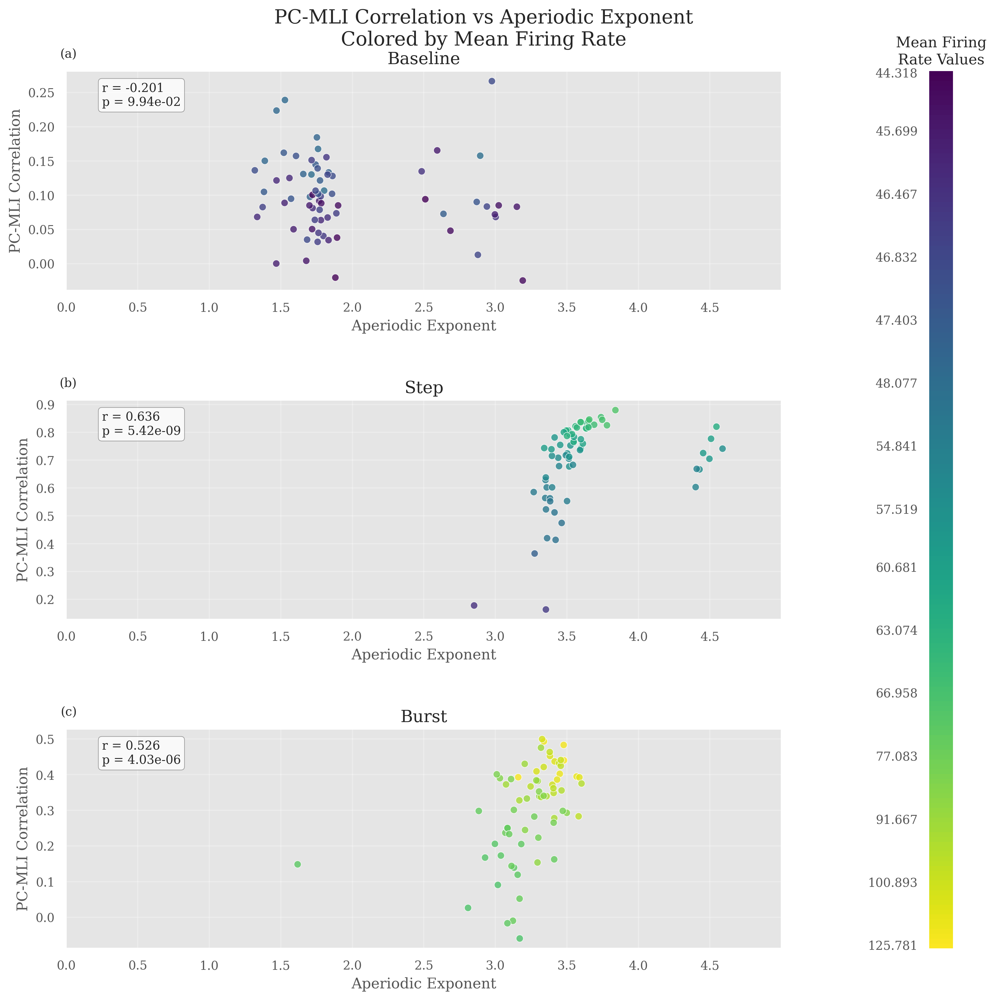

In [ ]:
# PC-MLI correlation colored by mean firing rate only
fig = plt.figure(figsize=(12, 12), dpi=300)
gs = GridSpec(3, 2, figure=fig, 
              width_ratios=[3, 0.1], 
              left=0.1, right=0.95, top=0.92, bottom=0.08, 
              wspace=0.4, hspace=0.5)

axs_firing = []
for i in range(3):
    ax_firing = fig.add_subplot(gs[i, 0])
    axs_firing.append(ax_firing)

ax_heatmap = fig.add_subplot(gs[:, 1])

corr_results_baseline_with_fr = corr_results_baseline.merge(
    foof_features_baseline[['cell_id', 'Mean_Firing_Rate']], on='cell_id', how='left')
corr_results_step_with_fr = corr_results_step.merge(
    foof_features_step[['cell_id', 'Mean_Firing_Rate']], on='cell_id', how='left')
corr_results_burst_with_fr = corr_results_burst.merge(
    foof_features_burst[['cell_id', 'Mean_Firing_Rate']], on='cell_id', how='left')

datasets_with_fr = [corr_results_baseline_with_fr, corr_results_step_with_fr, corr_results_burst_with_fr]

for i, (data, ax) in enumerate(zip(datasets_with_fr, axs_firing)):
    sns.scatterplot(data=data, x='exponents', y='pc_MLI_correlations',
                    hue='Mean_Firing_Rate', palette=colors_mean_fr_raw, 
                    ax=ax, s=35, alpha=0.8)
    if ax.get_legend():
        ax.get_legend().remove()

    r_value, p_value = spearmanr(data['exponents'], data['pc_MLI_correlations'])
    
    stats_text = f'r = {r_value:.3f}\np = {p_value:.2e}'
    ax.text(0.05, 0.95, stats_text, 
            transform=ax.transAxes, verticalalignment='top', 
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.8, edgecolor='gray'),
            fontsize=10)
    
    condition_names = ["Baseline", "Step", "Burst"]
    print(f"{condition_names[i]} - Spearman correlation between aperiodic exponent and PC-MLI correlation: r={r_value:.3f}, p={p_value:.4f}")

sns.heatmap(data=mean_fr_labels_data, ax=ax_heatmap, 
           cmap=mcolors.ListedColormap(mean_fr_colors), 
           cbar=False, yticklabels=mean_fr_labels_display, 
           xticklabels=False)
ax_heatmap.set_title("Mean Firing\nRate Values", fontsize=12)
ax_heatmap.tick_params(axis='y', labelsize=10, rotation=0)

titles = ["Baseline", "Step", "Burst"]

for i, (title, ax) in enumerate(zip(titles, axs_firing)):
    ax.set_title(f"{title}", fontsize=14)
    ax.set_xlabel("Aperiodic Exponent", fontsize=12)
    ax.set_ylabel("PC-MLI Correlation", fontsize=12)
    ax.set_xlim(0, 5.0)
    ax.set_xticks(np.arange(0, 5, 0.5))
    ax.tick_params(axis='both', labelsize=10)
    ax.text(0.015, 1.05, f'({chr(97 + i)})', transform=ax.transAxes, 
            va='bottom', ha='right', fontsize=10)
    ax.grid(True, alpha=0.3)

fig.suptitle("PC-MLI Correlation vs Aperiodic Exponent\nColored by Mean Firing Rate", fontsize=16)
plt.tight_layout()
plt.show()

In [35]:
def visualize_3d_functional_network(cell_data, feature_df, color_by='Mean_Phase', 
                                  condition_name='', color_palette=None):
    """
    3D visualization of cerebellar network colored by functional properties
    """
    # Extract positions
    positionsPC = cell_data['purkinje_cell']['position']
    positionsBK = cell_data['basket_cell']['position'] 
    positionsSC = cell_data['stellate_cell']['position']
    
    # Create 3D plot
    fig = plt.figure(figsize=(15, 12), dpi=300)
    ax = fig.add_subplot(111, projection='3d')
    
    # Plot Stellate cells (background, muted)
    ax.scatter(positionsSC[:, 0], positionsSC[:, 1], positionsSC[:, 2],
               c='lightblue', s=20, alpha=0.3, label='Stellate cells', 
               edgecolors='none')
    
    # Plot Basket cells (background, muted)
    ax.scatter(positionsBK[:, 0], positionsBK[:, 1], positionsBK[:, 2],
               c='lightgreen', s=30, alpha=0.3, label='Basket cells',
               edgecolors='none')
    
    # Plot Purkinje cells colored by functional property
    if color_palette is not None:
        # Map feature values to colors
        feature_values = feature_df[color_by].values
        colors = [color_palette.get(val, 'gray') for val in feature_values]
    else:
        # Use continuous colormap
        feature_values = feature_df[color_by].values
        colors = plt.cm.viridis(feature_values / np.max(feature_values))
    
    scatter = ax.scatter(positionsPC[:, 0], positionsPC[:, 1], positionsPC[:, 2],
                        c=colors, s=150, alpha=0.9, 
                        label=f'Purkinje cells ({condition_name})',
                        edgecolors='black', linewidth=1)
    
    # Formatting
    ax.set_xlabel('X Position (μm)', fontsize=12)
    ax.set_ylabel('Y Position (μm)', fontsize=12)
    ax.set_zlabel('Z Position (μm)', fontsize=12)
    ax.set_title(f'3D Cerebellar Network\nPurkinje Cells Colored by {color_by} ({condition_name})', 
                 fontsize=14)

    # Set limits
    ax.set_xlim(0, 300)
    ax.set_ylim(0, 200)
    ax.set_zlim(0, 295)
    
    # Legend
    ax.legend(loc='upper left', fontsize=10, framealpha=0.9)
    
    plt.tight_layout()
    plt.show()
    
    return fig, ax, scatter


In [ ]:
def create_3d_multi_panel_figure(pc_feature_dfs, MLI_positions, color_by='Mean_Phase', 
                                palette=None, titles=None, heatmap_labels_data=None, 
                                heatmap_labels_display=None, heatmap_colors=None, 
                                add_annotations=True, fig=None, axes_3d=None, axes_heatmap=None,
                                show_plot=True):
    """
    Create a multi-panel figure with 3D plots and colorbar(s) - 2 plots on top row, 1 on bottom
    
    Parameters:
    - pc_feature_dfs: List of 3 DataFrames with Purkinje cell positions + features
    - MLI_positions: DataFrame with all cell positions  
    - color_by: Feature to color by
    - palette: Color palette dictionary OR list of 3 dictionaries (one per condition)
    - titles: List of subplot titles
    - heatmap_labels_data: Labels data OR list of 3 label arrays
    - heatmap_labels_display: Display labels OR list of 3 display label arrays
    - heatmap_colors: Colors OR list of 3 color arrays
    - add_annotations: Whether to add cell ID annotations
    - fig: External figure object (optional)
    - axes_3d: List of 3 external 3D axes (optional)
    - axes_heatmap: External heatmap axis or list of 3 heatmap axes (optional)
    - show_plot: Whether to show the plot immediately (default True)
    """
    # individual color schemes for each condition
    individual_colormaps = (isinstance(palette, list) and 
                           isinstance(heatmap_labels_data, list) and 
                           isinstance(heatmap_colors, list))
    
    # Use external axes if provided, otherwise create new figure
    if fig is None or axes_3d is None:
        if individual_colormaps:
            # 3 plots (2 on top, 1 on bottom) + 3 individual colorbars
            fig = plt.figure(figsize=(8.27, 10), dpi=300)
            gs = GridSpec(3, 3, figure=fig,
                          width_ratios=[1, 1, 0.001],  # Two 3D plots + colorbar column
                          height_ratios=[1, 1, 0.5],  # Top row, bottom row, spacing
                          left=0.01, right=0.95, top=0.9, bottom=0.08, 
                          wspace=0.15, hspace=0.2)
            
            axes_3d = []
            axes_heatmap = []
            
            # Top row: Baseline (0,0), Step (0,1)
            ax_baseline = fig.add_subplot(gs[0, 0], projection='3d')
            ax_step = fig.add_subplot(gs[0, 1], projection='3d')
            # Bottom row: Burst (1,0), spanning first column
            ax_burst = fig.add_subplot(gs[1, 0], projection='3d')
            
            axes_3d = [ax_baseline, ax_step, ax_burst]
            
            ax_heatmap_baseline = fig.add_subplot(gs[0, 2])
            ax_heatmap_step = fig.add_subplot(gs[1, 2])  
            ax_heatmap_burst = fig.add_subplot(gs[2, 2])
            
            axes_heatmap = [ax_heatmap_baseline, ax_heatmap_step, ax_heatmap_burst]
            
        else:
            # 3 plots (2 on top, 1 on bottom) + 1 shared colorbar
            fig = plt.figure(figsize=(8.27, 10), dpi=300) 
            gs = GridSpec(2, 3, figure=fig,
                          width_ratios=[1, 1, 0.05], 
                          height_ratios=[1, .7],  # Equal height for both rows
                          left=0.01, right=0.95, top=0.9, bottom=0.08, 
                          wspace=0.3, hspace=0.1)
            
            axes_3d = []
            
            # Top row: Baseline (0,0), Step (0,1)
            ax_baseline = fig.add_subplot(gs[0, 0], projection='3d')
            ax_step = fig.add_subplot(gs[0, 1], projection='3d')
            # Bottom row: Burst (1,0)
            ax_burst = fig.add_subplot(gs[1, :2], projection='3d')  # Span both columns
            
            axes_3d = [ax_baseline, ax_step, ax_burst]
            
            if axes_heatmap is None:
                axes_heatmap = fig.add_subplot(gs[:, 2])  # Spans both rows
                
    else:
        if axes_heatmap is None:
            if individual_colormaps:
                raise ValueError("When using external axes with individual colormaps, axes_heatmap must be provided as a list of 3 axes")
            else:
                axes_heatmap = None
    
    x_size, y_size, z_size = 300.0, 200.0, 295.0
    # positionsBK = MLI_positions[MLI_positions['cell_type'] == 'basket_cell'][['x', 'y', 'z']].values
    # positionsSC = MLI_positions[MLI_positions['cell_type'] == 'stellate_cell'][['x', 'y', 'z']].values
    
    if titles is None:
        titles = ['Baseline', 'Step', 'Burst']
    
    for i, (ax, pc_data, title) in enumerate(zip(axes_3d, pc_feature_dfs, titles)):
        # Purkinje positions
        positionsPC = pc_data[['x', 'y', 'z']].values
        
        if color_by in pc_data.columns and palette is not None:
            feature_values = pc_data[color_by].values
            
            if individual_colormaps:
                current_palette = palette[i]
                colors = [current_palette.get(val, 'gray') for val in feature_values]
            else:
                colors = [palette.get(val, 'gray') for val in feature_values]
                
            scatter = ax.scatter(positionsPC[:, 0], positionsPC[:, 1], positionsPC[:, 2],
                               c=colors, s=40, alpha=0.9, edgecolors='black', 
                               linewidth=0.5, marker='s',
                               label='Purkinje cells' if i == 0 else '')
        else:
            scatter = ax.scatter(positionsPC[:, 0], positionsPC[:, 1], positionsPC[:, 2],
                               c='red', s=50, alpha=0.9, edgecolors='black',
                               linewidth=0.5, marker='s',
                               label='Purkinje cells' if i == 0 else '')
        
        # Add cell ID annotations
        if add_annotations and 'cell_id' in pc_data.columns:
            for idx, row in pc_data.iterrows():
                ax.text(row['x'], row['y'], row['z'],
                       str(row['cell_id']), fontsize=5, color='black',
                       bbox=dict(facecolor='white', alpha=0.65, edgecolor='none', pad=0.5))


        # Add layer boundaries
        granular_layer = 130.0
        
        z_layers = [
            granular_layer]
        
        xx, yy = np.meshgrid(np.linspace(0, x_size, 8), np.linspace(0, y_size, 8))
        for z_pos in z_layers:
            zz = np.ones_like(xx) * z_pos
            ax.plot_surface(xx, yy, zz, alpha=0.01, color='gray')
        
        # Set 3D plot properties
        ax.set_xlim(0, x_size)
        ax.set_ylim(0, y_size) 
        ax.set_zlim(0, z_size)
        ax.set_title(title, pad=15)
        ax.set_xlabel('X (μm)', fontsize=9)
        ax.set_ylabel('Y (μm)', fontsize=9)
        ax.set_zlabel('Z (μm)', fontsize=9)
        ax.grid(False)
        
        ax.view_init(elev=20, azim=45)
        
        if i == 0:
            ax.legend(loc='upper right', fontsize=6, framealpha=0.8)
    
    if axes_heatmap is not None:
        if individual_colormaps and isinstance(axes_heatmap, list):
            # Individual colorbars for each condition
            for i, ax_heatmap in enumerate(axes_heatmap):
                if (heatmap_labels_data is not None and 
                    heatmap_colors is not None and 
                    heatmap_labels_display is not None):
                    
                    sns.heatmap(data=heatmap_labels_data[i], ax=ax_heatmap, 
                               cmap=mcolors.ListedColormap(heatmap_colors[i]), 
                               cbar=False, yticklabels=heatmap_labels_display[i], 
                               xticklabels=False)
                    ax_heatmap.set_title(f"{titles[i]}\n{color_by}", fontsize=9)
                    ax_heatmap.tick_params(axis='y', labelsize=7)
        else:
            if isinstance(axes_heatmap, list):
                heatmap_ax = axes_heatmap[0]
            else:
                heatmap_ax = axes_heatmap
            
            if heatmap_labels_data is not None and heatmap_colors is not None:
                sns.heatmap(data=heatmap_labels_data, ax=heatmap_ax, 
                           cmap=mcolors.ListedColormap(heatmap_colors), 
                           cbar=False, yticklabels=heatmap_labels_display, 
                           xticklabels=False)
                heatmap_ax.set_title(f"{color_by}\nValues", fontsize=10)
                heatmap_ax.tick_params(axis='y', labelsize=8, rotation=0)
    
    if show_plot and (fig is None or axes_3d is None or len([ax for ax in axes_3d if ax.figure == fig]) == len(axes_3d)):
        for i, ax in enumerate(axes_3d):
            ax.text2D(0.08, 1.0, f"({chr(i + 65).lower()})", transform=ax.transAxes, va='bottom', ha='right', fontsize=10)
        fig.suptitle(f"3D Cerebellar Network:\nPurkinje Cells Colored by {color_by}", 
                    fontsize=14, y=0.95)
        plt.tight_layout
        plt.show()

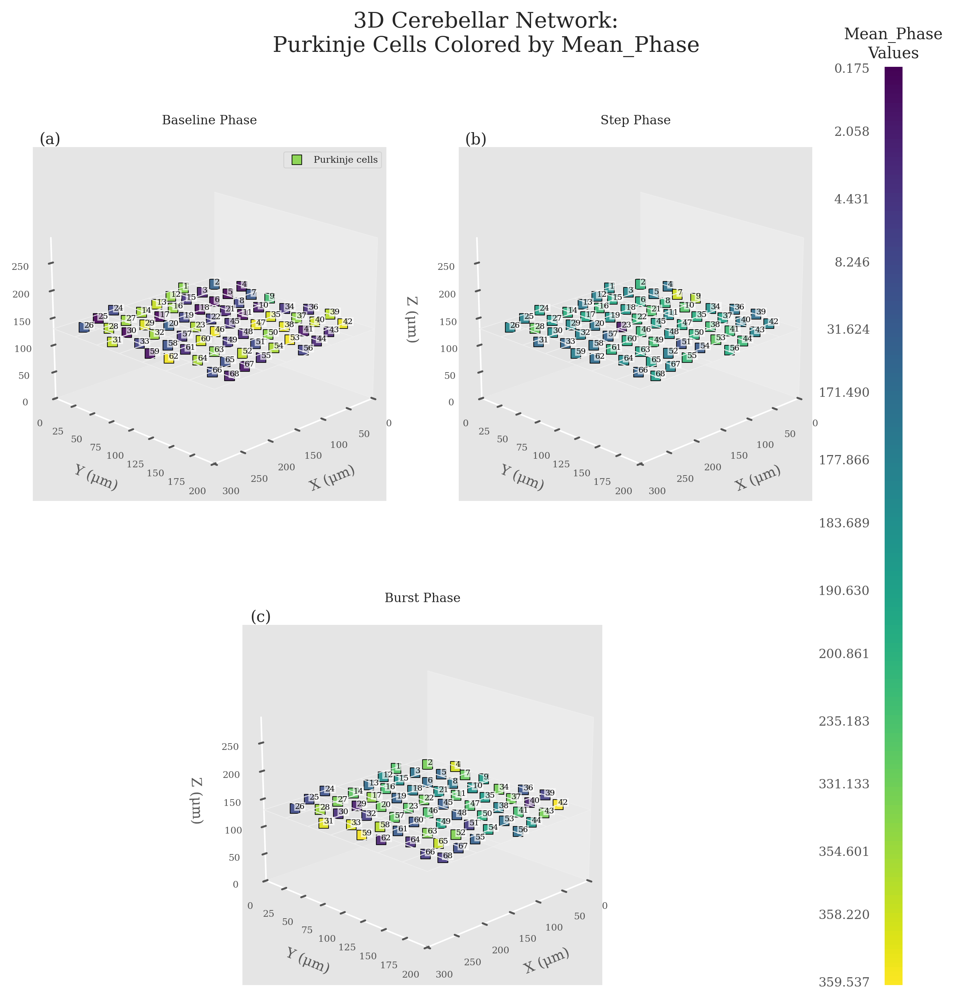

In [37]:
create_3d_multi_panel_figure(pc_feature_dfs=[pc_with_features_baseline, pc_with_features_step, pc_with_features_burst], 
                            MLI_positions=MLI_positions, 
                            color_by='Mean_Phase',
                            palette=colors_phase_raw, 
                            titles=['Baseline Phase', 'Step Phase', 'Burst Phase'],
                            heatmap_labels_data=phase_labels_data,
                            heatmap_labels_display=phase_labels_display,
                            heatmap_colors=phase_colors, add_annotations=True)

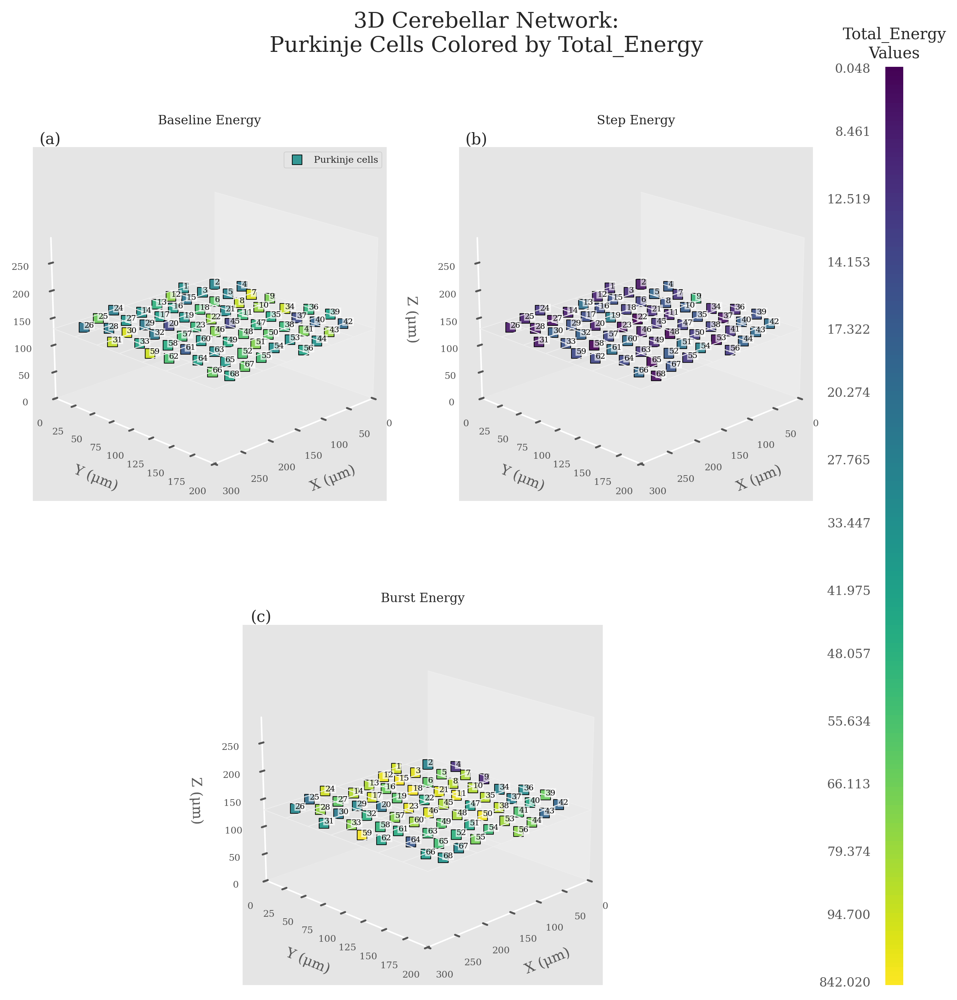

In [38]:
create_3d_multi_panel_figure(
    pc_feature_dfs=[pc_with_features_baseline, pc_with_features_step, pc_with_features_burst],
    MLI_positions=MLI_positions,
    color_by='Total_Energy',
    palette=colors_energy_raw,
    titles=['Baseline Energy', 'Step Energy', 'Burst Energy'],
    heatmap_labels_data=energy_labels_data,
    heatmap_labels_display=energy_labels_display,
    heatmap_colors=energy_colors, add_annotations=True
)

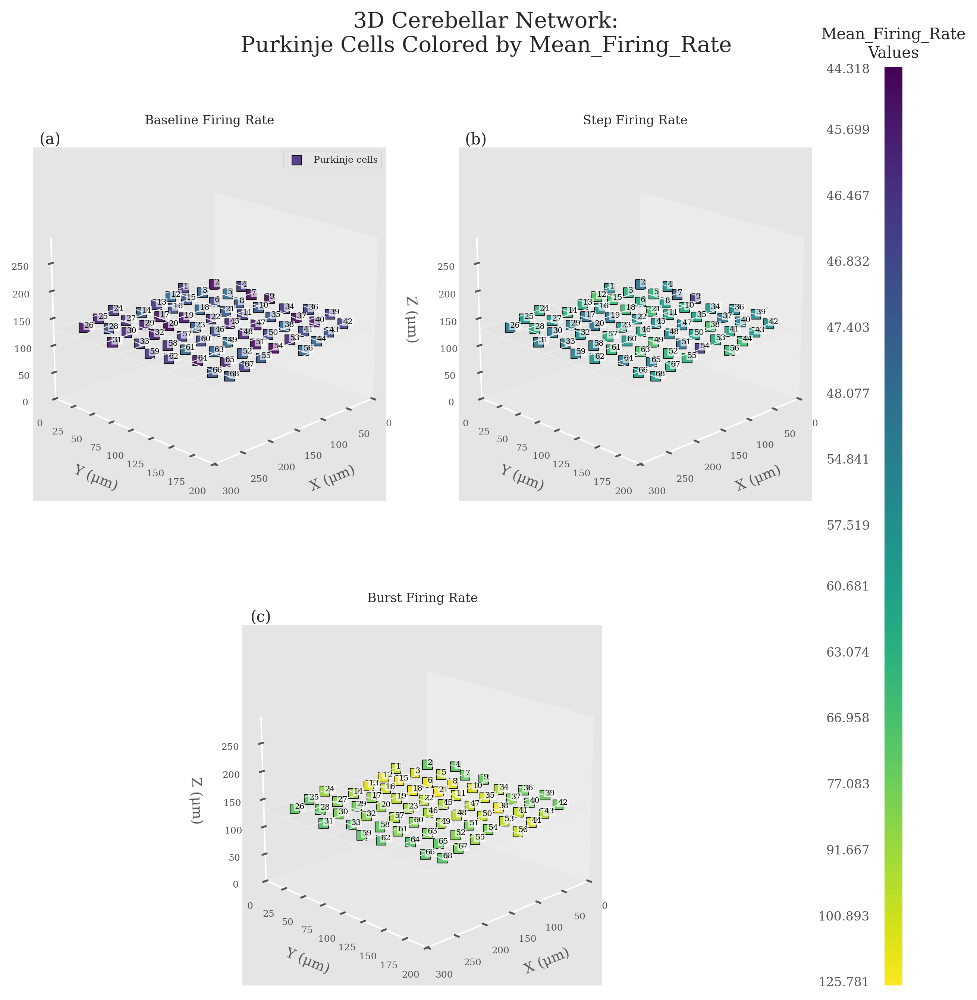

In [39]:
create_3d_multi_panel_figure(
    pc_feature_dfs=[pc_with_features_baseline, pc_with_features_step, pc_with_features_burst],
    MLI_positions=MLI_positions,
    color_by='Mean_Firing_Rate',
    palette=colors_mean_fr_raw,
    titles=['Baseline Firing Rate', 'Step Firing Rate', 'Burst Firing Rate'],
    heatmap_labels_data=mean_fr_labels_data,
    heatmap_labels_display=mean_fr_labels_display,
    heatmap_colors=mean_fr_colors, add_annotations=True
)

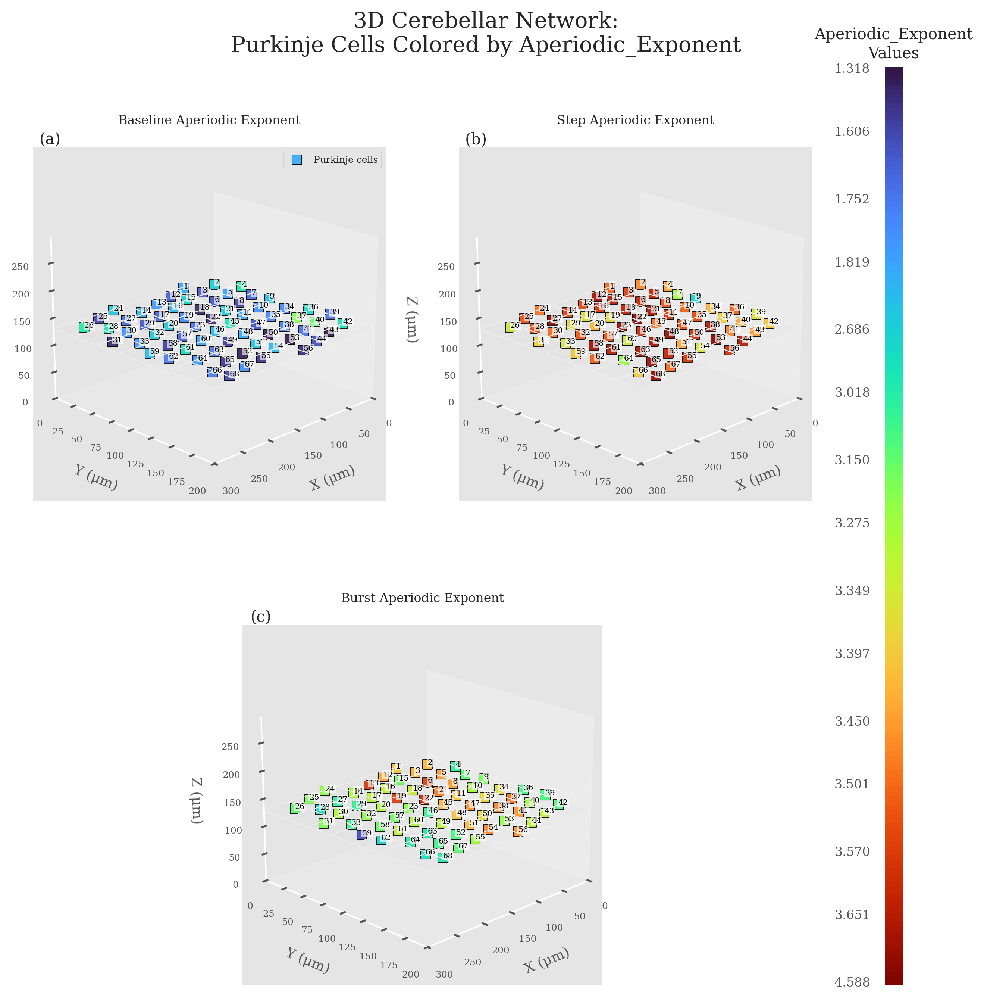

In [40]:
create_3d_multi_panel_figure(
    pc_feature_dfs=[pc_with_features_baseline, pc_with_features_step, pc_with_features_burst],
    MLI_positions=MLI_positions,
    color_by='Aperiodic_Exponent',
    palette=colors_aperiodic_raw,
    titles=['Baseline Aperiodic Exponent', 'Step Aperiodic Exponent', 'Burst Aperiodic Exponent'],
    heatmap_labels_data=aperiodic_data,
    heatmap_labels_display=aperiodic_labels_display,
    heatmap_colors=aperiodic_colors, add_annotations=True,
    show_plot=True
)

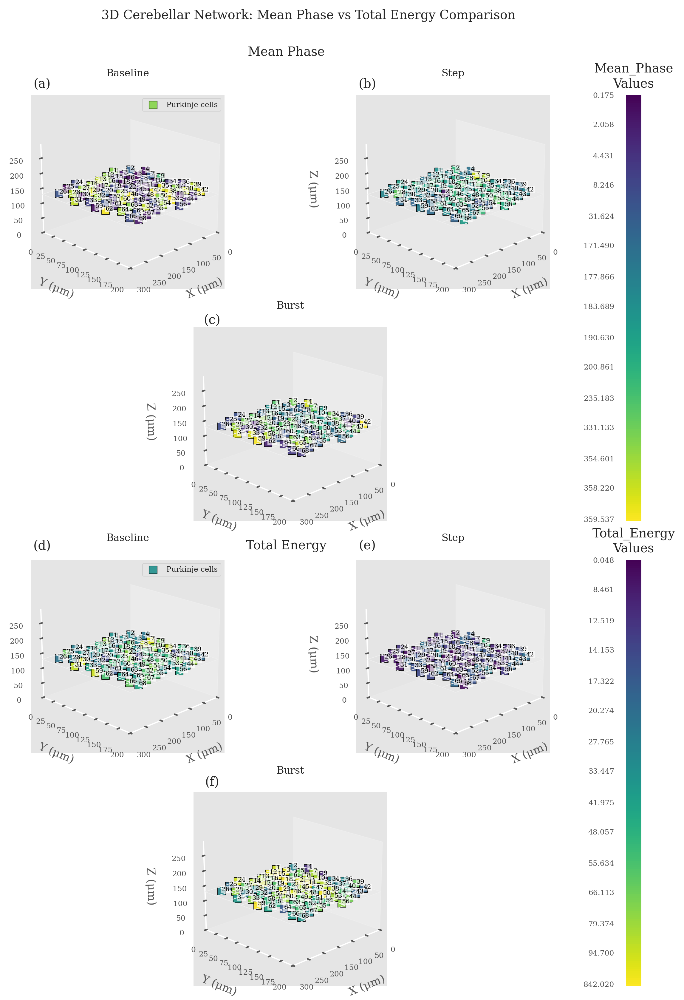

In [ ]:
# Combined figure with Mean Phase (top) and Total Energy (bottom)
fig = plt.figure(figsize=(8.27, 12), dpi=300)
gs = GridSpec(4, 3, figure=fig,
              width_ratios=[1, 1, 0.05],  # Reduced colorbar width from 0.15 to 0.1
              height_ratios=[1, 1, 1, 1],  # Four rows: Phase row 1, Phase row 2, Energy row 1, Energy row 2
              left=0.05, right=0.95, top=0.88, bottom=0.05,  # Increased left/right margins
              wspace=0.1, hspace=0.2)  


# Row 0: Baseline (0,0), Step (0,1)
ax_phase_baseline = fig.add_subplot(gs[0, 0], projection='3d')
ax_phase_step = fig.add_subplot(gs[0, 1], projection='3d')

# Row 1: Burst (1,0) spanning first column, centered
ax_phase_burst = fig.add_subplot(gs[1, :2], projection='3d') 

axes_3d_phase = [ax_phase_baseline, ax_phase_step, ax_phase_burst]

# Row 2: Baseline (2,0), Step (2,1)
ax_energy_baseline = fig.add_subplot(gs[2, 0], projection='3d')
ax_energy_step = fig.add_subplot(gs[2, 1], projection='3d')
# Row 3: Burst (3,0) spanning first column, centered
ax_energy_burst = fig.add_subplot(gs[3, :2], projection='3d')  # Span both columns for centering

axes_3d_energy = [ax_energy_baseline, ax_energy_step, ax_energy_burst]

ax_heatmap_phase = fig.add_subplot(gs[0:2, 2])  # Spans rows 0-1 for Phase
ax_heatmap_energy = fig.add_subplot(gs[2:4, 2])  # Spans rows 2-3 for Energy

create_3d_multi_panel_figure(
    pc_feature_dfs=[pc_with_features_baseline, pc_with_features_step, pc_with_features_burst], 
    MLI_positions=MLI_positions, 
    color_by='Mean_Phase',
    palette=colors_phase_raw, 
    titles=['Baseline', 'Step', 'Burst'],
    heatmap_labels_data=phase_labels_data,
    heatmap_labels_display=phase_labels_display,
    heatmap_colors=phase_colors, 
    add_annotations=True,
    fig=fig,
    axes_3d=axes_3d_phase,
    axes_heatmap=ax_heatmap_phase,  
    show_plot=False 
)

create_3d_multi_panel_figure(
    pc_feature_dfs=[pc_with_features_baseline, pc_with_features_step, pc_with_features_burst],
    MLI_positions=MLI_positions,
    color_by='Total_Energy',
    palette=colors_energy_raw,
    titles=['Baseline', 'Step', 'Burst'],
    heatmap_labels_data=energy_labels_data,
    heatmap_labels_display=energy_labels_display,
    heatmap_colors=energy_colors, 
    add_annotations=True,
    fig=fig,
    axes_3d=axes_3d_energy,
    axes_heatmap=ax_heatmap_energy,
    show_plot=False  
)

fig.text(0.47, 0.92, 'Mean Phase', ha='center', va='center', fontsize=10)  
fig.text(0.47, 0.46, 'Total Energy', ha='center', va='center', fontsize=10) 

fig.suptitle('3D Cerebellar Network: Mean Phase vs Total Energy Comparison', y=0.96, fontsize=10)

fig.text(0.14, 0.89, '(a)', ha='center', va='center', fontsize=10)  # Phase Baseline
fig.text(0.58, 0.89, '(b)', ha='center', va='center', fontsize=10)  # Phase Step
fig.text(0.37, 0.67, '(c)', ha='center', va='center', fontsize=10)  # Phase Burst

fig.text(0.14, 0.46, '(d)', ha='center', va='center', fontsize=10)  # Energy Baseline
fig.text(0.58, 0.46, '(e)', ha='center', va='center', fontsize=10)  # Energy Step
fig.text(0.37, 0.24, '(f)', ha='center', va='center', fontsize=10)  # Energy Burst

ax_heatmap_phase.tick_params(axis='y', labelrotation=0, labelsize=6)
ax_heatmap_energy.tick_params(axis='y', labelrotation=0, labelsize=6)  
plt.show()

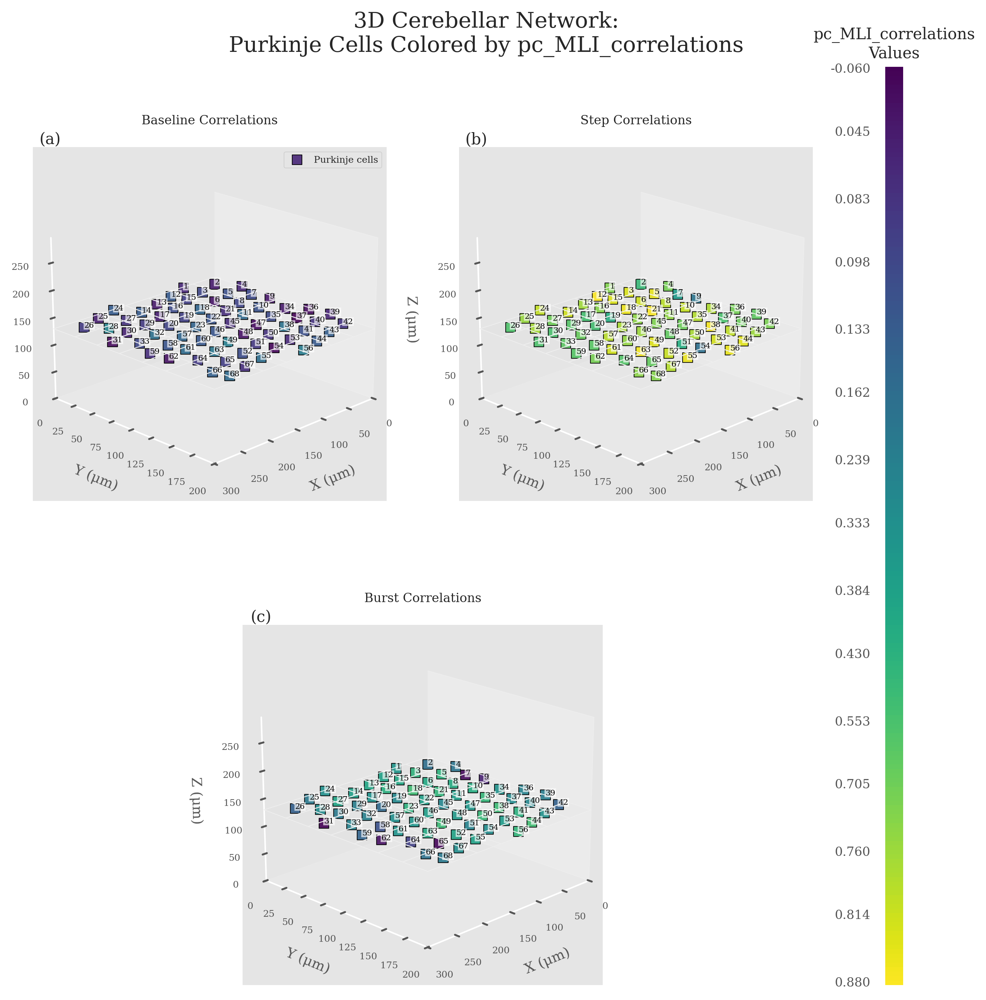

In [44]:
create_3d_multi_panel_figure(
    pc_feature_dfs=[pc_with_features_baseline, pc_with_features_step, pc_with_features_burst],
    MLI_positions=MLI_positions,
    color_by='pc_MLI_correlations',
    palette=colors_correlation_raw,
    titles=['Baseline Correlations', 'Step Correlations', 'Burst Correlations'],
    heatmap_labels_data=correlation_data,
    heatmap_labels_display=correlation_labels_display,
    heatmap_colors=correlation_colors, add_annotations=True
)

# Spearman's Correlation Matrix, with p-values

Variables to Correlate:
- Firing rate
- Slope
- Mean phase
- Total energy
- MLI-PC correlation (likely Multi-Layer Inhibition to Purkinje Cell correlation)

ICA components Matrix
- Mean rates and ICA components
- Slope vs ICA components
- Mean Phase vs ICA components
- Total Energy vs ICA components
- MLI-PC correlation vs ICA components

Conditions to Analyze:
- Baseline condition
- Multilevel condition
- Burst condition

Analysis Structure:
6 panels total:

Top 3 panels: Spearman correlation matrices for each condition

Bottom 3 panels: Corresponding p-value matrices

In [ ]:
def create_single_correlation_matrix(data, condition_name, variables=None, variable_labels=None, 
                                   figsize=(8, 8), show_triangle='upper', ax=None, show_plot=True):
    """
    Create a single Spearman correlation matrix with p-values for any given dataset
    
    Parameters:
    - data: DataFrame with the variables to correlate
    - condition_name: String name for the condition (used in title)
    - variables: List of variable names to correlate (default: predefined set)
    - variable_labels: List of display labels for variables (default: predefined set)
    - figsize: Tuple for figure size (ignored if ax is provided)
    - show_triangle: 'upper', 'lower', or 'both' to control which triangle to display
    - ax: External matplotlib axis (optional)
    - show_plot: Whether to show the plot immediately (default True)
    """
    if variables is None:
        variables = ['Mean_Firing_Rate', 'Aperiodic_Exponent', 'Mean_Phase', 'Total_Energy', 'pc_MLI_correlations']
    
    if variable_labels is None:
        variable_labels = ['Firing Rate', 'Aperiodic\nExponent', 'Mean Phase', 'Total Energy', 'PC-MLI\nCorrelation']
    
    n_vars = len(variables)
    corr_matrix = np.zeros((n_vars, n_vars))
    pval_matrix = np.zeros((n_vars, n_vars))
    
    # Pairwise Spearman correlations
    for j in range(n_vars):
        for k in range(n_vars):
            if j == k:
                corr_matrix[j, k] = 1.0
                pval_matrix[j, k] = 0.0
            else:
                var1_data = data[variables[j]].values
                var2_data = data[variables[k]].values
                
                mask = ~(np.isnan(var1_data) | np.isnan(var2_data))
                var1_clean = var1_data[mask]
                var2_clean = var2_data[mask]
                
                if len(var1_clean) > 1:
                    corr, pval = spearmanr(var1_clean, var2_clean)
                    corr_matrix[j, k] = corr
                    pval_matrix[j, k] = pval
                else:
                    corr_matrix[j, k] = np.nan
                    pval_matrix[j, k] = np.nan
    
    display_matrix = corr_matrix.copy()
    
    if show_triangle == 'upper':
        mask_matrix = np.tril(np.ones_like(corr_matrix, dtype=bool), k=0) 
        display_matrix = np.ma.masked_where(mask_matrix, display_matrix)
        pval_matrix = np.ma.masked_where(mask_matrix, pval_matrix)
    elif show_triangle == 'lower':
        mask_matrix = np.triu(np.ones_like(corr_matrix, dtype=bool), k=0)
        display_matrix = np.ma.masked_where(mask_matrix, display_matrix)
        pval_matrix = np.ma.masked_where(mask_matrix, pval_matrix)
    
    if ax is None:
        fig, ax = plt.subplots(figsize=figsize, dpi=300)
        created_fig = True
    else:
        created_fig = False
        fig = ax.figure
    
    im = ax.imshow(display_matrix, cmap='RdBu_r', vmin=-1, vmax=1, aspect='equal')
    
    ax.set_xticks(range(len(variables)))
    ax.set_yticks(range(len(variables)))
    ax.grid(False)
    
    for j in range(len(variables)):
        for k in range(len(variables)):
            if j == k:
                continue
            if show_triangle == 'upper' and j > k:
                continue
            elif show_triangle == 'lower' and j < k:
                continue
                
            if not np.isnan(corr_matrix[j, k]):
                corr_val = corr_matrix[j, k]
                pval_val = pval_matrix.data[j, k] if hasattr(pval_matrix, 'data') else pval_matrix[j, k]
                
                corr_text = f'{corr_val:.3f}'

                if pval_val < 0.001:
                    pval_text = 'p<0.001'
                elif pval_val < 0.01:
                    pval_text = f'p<0.01'
                elif pval_val < 0.05:
                    pval_text = f'p<0.05'
                else:
                    pval_text = f'p={pval_val:.3f}'
                
                combined_text = f'{corr_text}\n{pval_text}'
                
                text_color = 'white' if abs(corr_val) > 0.5 else 'black'
                
                if pval_val < 0.05:
                    fontweight = 'bold'
                else:
                    fontweight = 'normal'
                
                ax.text(k, j, combined_text, 
                       ha='center', va='center', color=text_color, 
                       fontsize=7, fontweight=fontweight)
    
    ax.set_xticklabels(variable_labels, rotation=45, ha='right', fontsize=6)
    ax.set_yticklabels(variable_labels, fontsize=6)
    ax.set_title(f'{condition_name}\nSpearman Correlations', fontsize=10)
    
    ax.set_aspect('equal', adjustable='box')
    
    ax.tick_params(which='both', length=0)
    
    if created_fig:
        cbar = plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
        cbar.set_label('Correlation Coefficient', fontsize=6, rotation=90, labelpad=15)
        cbar.ax.tick_params(labelsize=6)
        
        if show_plot:
            plt.tight_layout()
            plt.show()
    
    print(f"Summary of Significant Correlations for {condition_name} (p < 0.05):")
    print("=" * 60)
    
    significant_pairs = []
    for j in range(len(variables)):
        for k in range(j+1, len(variables)):  # Only upper triangle for summary
            corr_val = corr_matrix[j, k]
            pval_val = pval_matrix.data[j, k] if hasattr(pval_matrix, 'data') else pval_matrix[j, k]
            
            if not np.isnan(pval_val) and pval_val < 0.05:
                significant_pairs.append((
                    variable_labels[j], 
                    variable_labels[k], 
                    corr_val, 
                    pval_val
                ))
    
    if significant_pairs:
        for var1, var2, corr, pval in significant_pairs:
            significance = "***" if pval < 0.001 else "**" if pval < 0.01 else "*"
            print(f"  {var1} ↔ {var2}: r = {corr:.3f}, p = {pval:.4f} {significance}")
    else:
        print("  No significant correlations found")
    
    return corr_matrix, pval_matrix

In [6]:
# Baseline condition
baseline_corr, baseline_pval = create_single_correlation_matrix(
    pc_with_features_baseline, 
    "Baseline"
)

NameError: name 'pc_with_features_baseline' is not defined

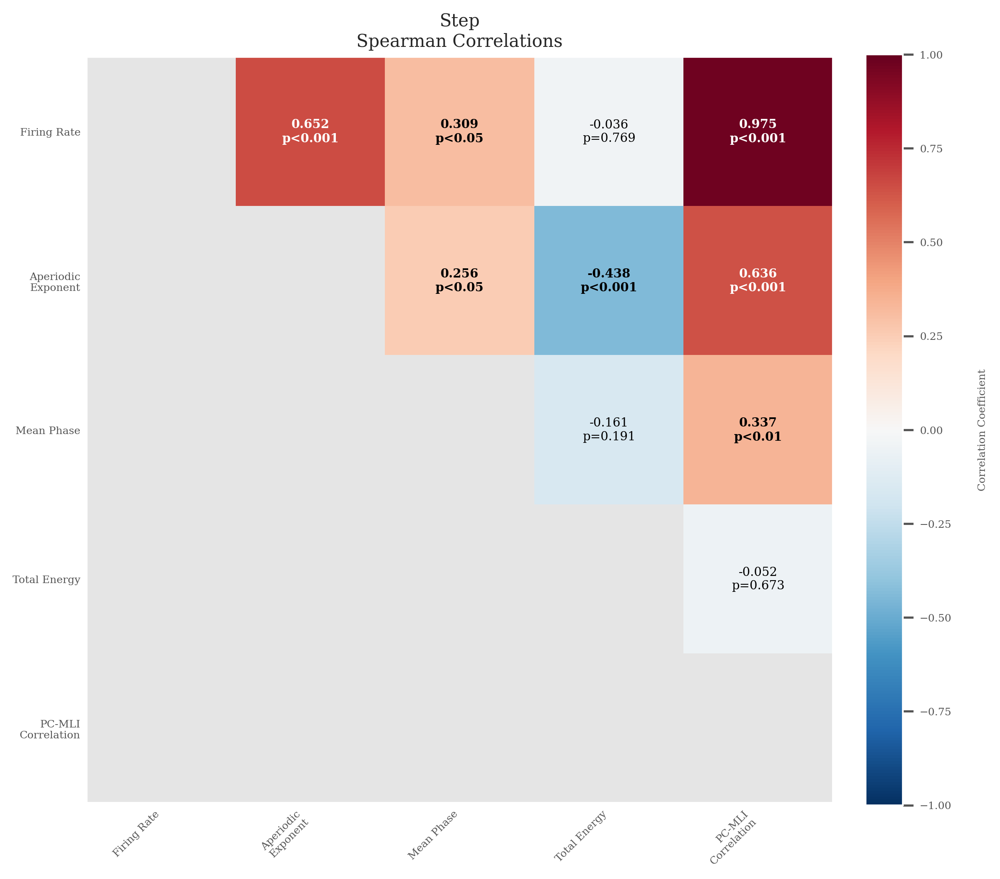

Summary of Significant Correlations for Step (p < 0.05):
  Firing Rate ↔ Aperiodic
Exponent: r = 0.652, p = 0.0000 ***
  Firing Rate ↔ Mean Phase: r = 0.309, p = 0.0103 *
  Firing Rate ↔ PC-MLI
Correlation: r = 0.975, p = 0.0000 ***
  Aperiodic
Exponent ↔ Mean Phase: r = 0.256, p = 0.0348 *
  Aperiodic
Exponent ↔ Total Energy: r = -0.438, p = 0.0002 ***
  Aperiodic
Exponent ↔ PC-MLI
Correlation: r = 0.636, p = 0.0000 ***
  Mean Phase ↔ PC-MLI
Correlation: r = 0.337, p = 0.0050 **


In [ ]:
# Step condition
step_corr, step_pval = create_single_correlation_matrix(
    pc_with_features_step, 
    "Step"
)

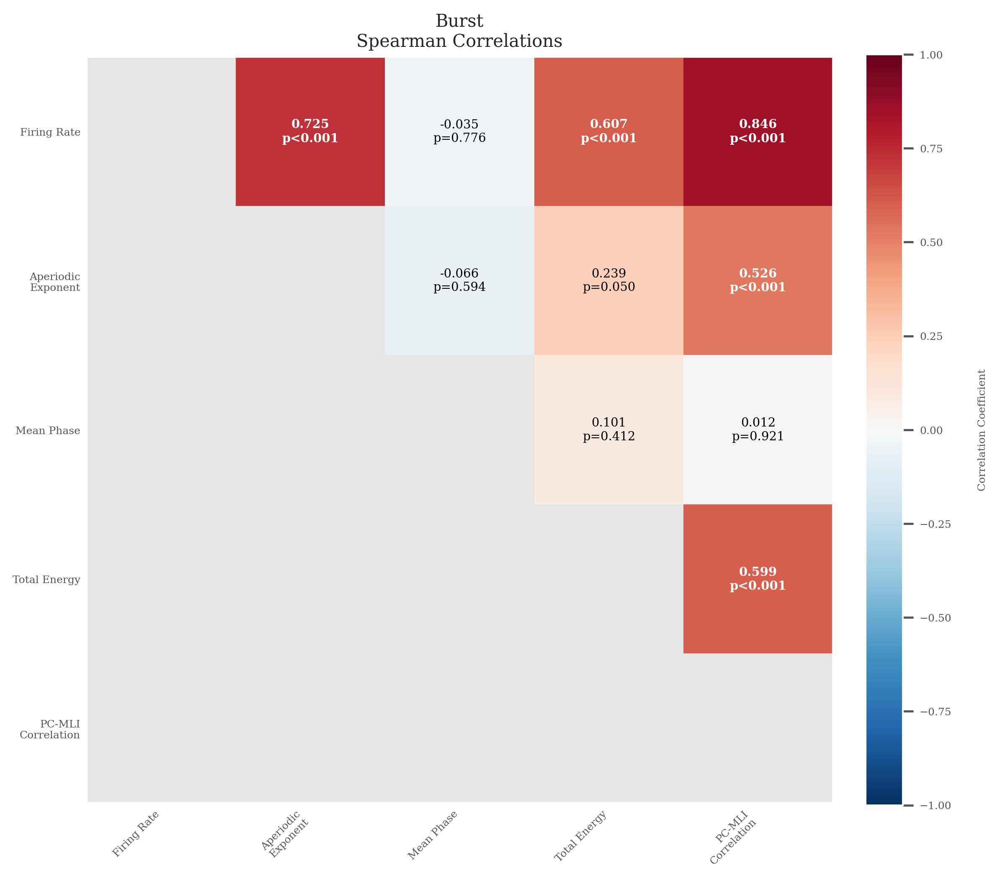

Summary of Significant Correlations for Burst (p < 0.05):
  Firing Rate ↔ Aperiodic
Exponent: r = 0.725, p = 0.0000 ***
  Firing Rate ↔ Total Energy: r = 0.607, p = 0.0000 ***
  Firing Rate ↔ PC-MLI
Correlation: r = 0.846, p = 0.0000 ***
  Aperiodic
Exponent ↔ PC-MLI
Correlation: r = 0.526, p = 0.0000 ***
  Total Energy ↔ PC-MLI
Correlation: r = 0.599, p = 0.0000 ***


In [ ]:
# Burst condition  
burst_corr, burst_pval = create_single_correlation_matrix(
    pc_with_features_burst, 
    "Burst"
)

Summary of Significant Correlations for Baseline (p < 0.05):
  Firing Rate ↔ Aperiodic
Exponent: r = -0.255, p = 0.0358 *
  Firing Rate ↔ PC-MLI
Correlation: r = 0.595, p = 0.0000 ***
  Aperiodic
Exponent ↔ Total Energy: r = -0.507, p = 0.0000 ***
Summary of Significant Correlations for Step (p < 0.05):
  Firing Rate ↔ Aperiodic
Exponent: r = 0.652, p = 0.0000 ***
  Firing Rate ↔ Mean Phase: r = 0.309, p = 0.0103 *
  Firing Rate ↔ PC-MLI
Correlation: r = 0.975, p = 0.0000 ***
  Aperiodic
Exponent ↔ Mean Phase: r = 0.256, p = 0.0348 *
  Aperiodic
Exponent ↔ Total Energy: r = -0.438, p = 0.0002 ***
  Aperiodic
Exponent ↔ PC-MLI
Correlation: r = 0.636, p = 0.0000 ***
  Mean Phase ↔ PC-MLI
Correlation: r = 0.337, p = 0.0050 **
Summary of Significant Correlations for Burst (p < 0.05):
  Firing Rate ↔ Aperiodic
Exponent: r = 0.725, p = 0.0000 ***
  Firing Rate ↔ Total Energy: r = 0.607, p = 0.0000 ***
  Firing Rate ↔ PC-MLI
Correlation: r = 0.846, p = 0.0000 ***
  Aperiodic
Exponent ↔ PC-MLI

/tmp/ipykernel_43219/286908456.py:50: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


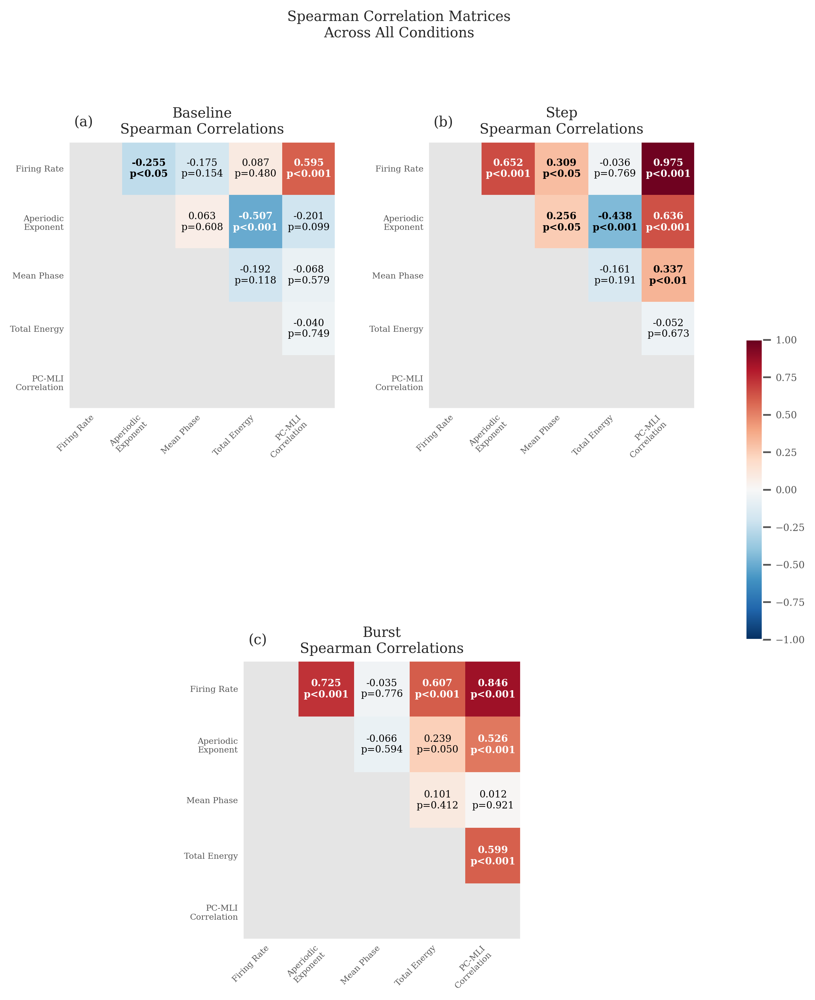

In [ ]:
fig = plt.figure(figsize=(8.27, 10), dpi=300)
gs = GridSpec(2, 3, figure=fig, width_ratios=[1, 1, 0.09], hspace=0.001,
               wspace=0.5, height_ratios=[1.8, 0.65], top=1.1, bottom=0.05, left=0.05, right=0.95)

ax_baseline = fig.add_subplot(gs[0, 0])
ax_step = fig.add_subplot(gs[0, 1])
ax_burst = fig.add_subplot(gs[1, :2])

baseline_corr, baseline_pval = create_single_correlation_matrix(
    pc_with_features_baseline, 
    "Baseline",
    ax=ax_baseline,
    show_plot=False
)

step_corr, step_pval = create_single_correlation_matrix(
    pc_with_features_step, 
    "Step",
    ax=ax_step,
    show_plot=False
)

burst_corr, burst_pval = create_single_correlation_matrix(
    pc_with_features_burst, 
    "Burst",
    ax=ax_burst,
    show_plot=False
)

# Create custom colorbar with precise positioning
# [left, bottom, width, height] - adjust these values to position it exactly where you want
ax_cbar = fig.add_axes([0.87, 0.35, 0.02, 0.3])  # Small colorbar in top-right area

# Add colorbar in the custom axis
im = ax_baseline.get_images()[0]
cbar = fig.colorbar(im, cax=ax_cbar)
cbar.ax.tick_params(labelsize=7)

# Add overall title
fig.suptitle('Spearman Correlation Matrices\nAcross All Conditions', fontsize=10, y=0.98, x=0.45)

for i, ax in enumerate([ax_baseline, ax_step, ax_burst]):
    ax.text(0.02, 1.1, f"({chr(i + 97)})", transform=ax.transAxes, va='top', ha='left', fontsize=10)

plt.tight_layout()
plt.show()

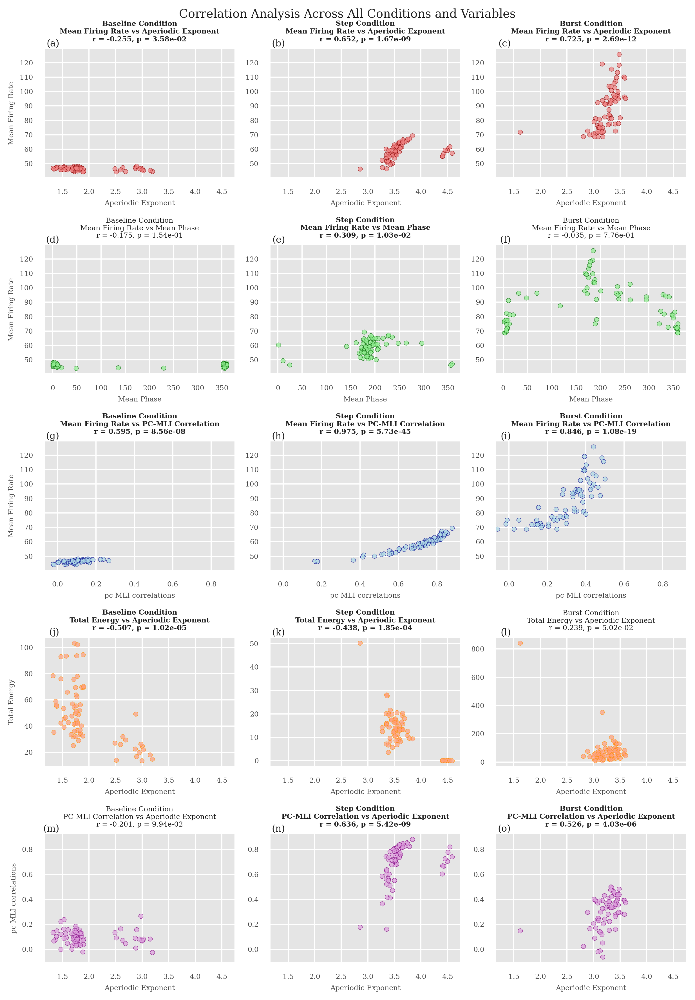

In [ ]:
plot_colors = [
    ('lightcoral', 'darkred'),      # Mean firing rate vs aperiodic exponent
    ('lightgreen', 'darkgreen'),    # Firing rate vs mean phase
    ('lightblue', 'darkblue'),      # Firing Rate vs PC-MLI Correlation
    ('lightsalmon', 'darkorange'),  # Total energy vs aperiodic exponent
    ('plum', 'purple')              # PC-MLI correlation vs aperiodic exponent
]

plot_configs = [
    {
        'data': [foof_features_baseline, foof_features_step, foof_features_burst],
        'x_col': 'Aperiodic_Exponent',
        'y_col': 'Mean_Firing_Rate',
        'title': 'Mean Firing Rate vs Aperiodic Exponent',
        'share_x': [True, True, True],  
        'share_y': [True, True, False]   
    },
    {
        'data': [foof_features_baseline, foof_features_step, foof_features_burst],
        'x_col': 'Mean_Phase',
        'y_col': 'Mean_Firing_Rate',
        'title': 'Mean Firing Rate vs Mean Phase',
        'share_x': [False, False, False],
        'share_y': [True, True, False]
    },
    {
        'data': [pc_with_features_baseline, pc_with_features_step, pc_with_features_burst],
        'x_col': 'pc_MLI_correlations',
        'y_col': 'Mean_Firing_Rate',
        'title': 'Mean Firing Rate vs PC-MLI Correlation',
        'share_x': [True, True, True],
        'share_y': [True, True, False]
    },
    {
        'data': [foof_features_baseline, foof_features_step, foof_features_burst],
        'x_col': 'Aperiodic_Exponent',
        'y_col': 'Total_Energy',
        'title': 'Total Energy vs Aperiodic Exponent',
        'share_x': [True, True, True],
        'share_y': [False, False, False]
    },
    {
        'data': [pc_with_features_baseline, pc_with_features_step, pc_with_features_burst],
        'x_col': 'Aperiodic_Exponent',
        'y_col': 'pc_MLI_correlations',
        'title': 'PC-MLI Correlation vs Aperiodic Exponent',
        'share_x': [True, True, True],
        'share_y': [True, True, False]
    }
]

conditions = ['Baseline', 'Step', 'Burst']

fig, axes = plt.subplots(5, 3, figsize=(8.27, 12), dpi=300)
fig.suptitle('Correlation Analysis Across All Conditions and Variables', fontsize=10, y=0.98)

for row, (config, colors) in enumerate(zip(plot_configs, plot_colors)):
    light_color, dark_color = colors
    
    for col, (condition, data) in enumerate(zip(conditions, config['data'])):
        ax = axes[row, col]
        ax.text(0.08, 1.0, f"({chr(row * 3 + col + 65).lower()})", transform=ax.transAxes, va='bottom', ha='right', fontsize=8)
        
        x = data[config['x_col']]
        y = data[config['y_col']]
        
        r, p = stats.spearmanr(x, y)
        
        sns.scatterplot(data=data, x=config['x_col'], y=config['y_col'], 
                       ax=ax, color=light_color, edgecolor=dark_color, 
                       s=15, alpha=0.7)
        if p < 0.05:
            corr_text = f"r = {r:.3f}, p = {p:.2e}"
            font_weight = 'bold'
        else:
            corr_text = f"r = {r:.3f}, p = {p:.2e}"
            font_weight = 'normal'

        ax.set_title(f"{condition} Condition\n{config['title']}\n{corr_text}", 
                    fontsize=6, fontweight=font_weight)
        
        ax.set_xlabel(config['x_col'].replace('_', ' '), fontsize=6)
        if col == 0:  # Only leftmost plots get y-labels
            ax.set_ylabel(config['y_col'].replace('_', ' '), fontsize=6)
        else:
            ax.set_ylabel('')
        
        if config['share_y'][col]: 
            ax.sharey(axes[row, 2])
        
        if config['share_x'][col]:
            ax.sharex(axes[row, 1])

plt.subplots_adjust(top=0.94, hspace=0.7, wspace=0.15)
plt.tight_layout()
plt.show()

